In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import warnings
import pickle
import myUtils
import os
from myUtils import *
from models.utils import *
from AOPC import *
from score import ScoreUtils
from models.dataset_loader import *
import sys
sys.path.append('models')

warnings.simplefilter("ignore")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#torch._C._jit_set_texpr_fuser_enabled(False)
model_name = 'huawei-noah/TinyBERT_General_4L_312D'

In [2]:
sorting = "confidence"
tokenizer = AutoTokenizer.from_pretrained(model_name, use_fast = False)
myUtils.tokenizer = tokenizer

# TinyBert

## Corona

In [3]:
ds_name = 'corona'
model_type = 'tinybert'
path = f'results/mp/{model_type}/{ds_name}/{sorting}/'
aopc = AOPC(path, tokenizer)

pos
0.1: ['hand', 'like', 'help', 'good', 'free', 'great', 'thank', 'safe', 'support', 'please', 'thanks', 'best', 'well', 'positive', 'love', 'safety', 'interesting', 'fresh', 'better', 'heroes', 'protect', 'care', 'confidence', 'nice', 'relief', 'hope', 'boost', 'save', 'energy', 'happy']
lossy-0.1: ['hand', 'like', 'help', 'good', 'free', 'thank', 'great', 'support', 'safe', 'please', 'thanks', 'best', 'well', 'love', 'positive', 'safety', 'fresh', 'better', 'interesting', 'relief', 'protect', 'confidence', 'heroes', 'hope', 'care', 'nice', 'boost', 'credit', 'increase', 'energy']
topk-0.1: ['hand', 'like', 'help', 'good', 'free', 'great', 'thank', 'safe', 'support', 'please', 'thanks', 'best', 'well', 'love', 'positive', 'better', 'safety', 'fresh', 'interesting', 'confidence', 'heroes', 'nice', 'protect', 'relief', 'hope', 'care', 'won', 'important', 'boost', 'credit']
desired-0.1: ['hand', 'like', 'help', 'good', 'please', 'safe', 'free', 'thank', 'support', 'great', 'thanks', 'w

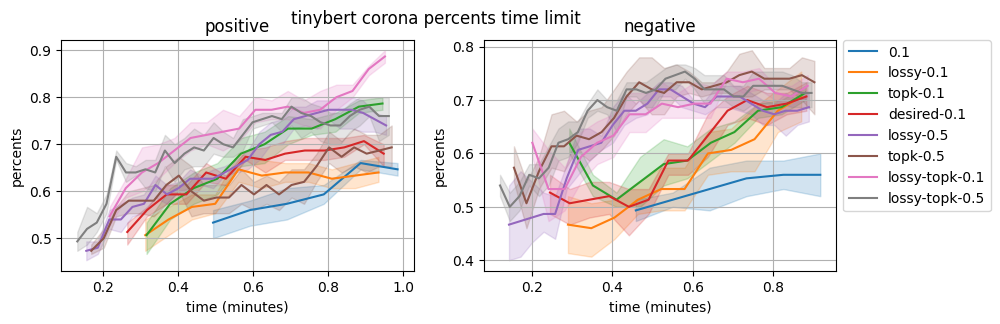

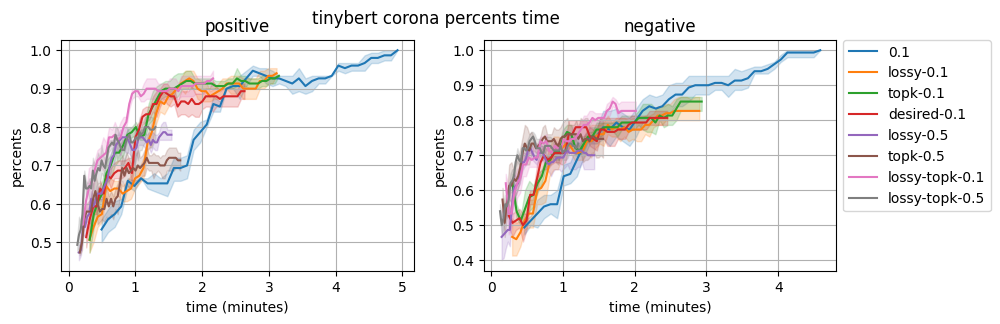

pos
0.1: ['hand', 'like', 'help', 'good', 'free', 'great', 'thank', 'safe', 'support', 'please', 'thanks', 'best', 'well', 'positive', 'love', 'safety', 'interesting', 'fresh', 'better', 'heroes', 'protect', 'care', 'confidence', 'nice', 'relief', 'hope', 'boost', 'save', 'energy', 'happy']
lossy-0.1: ['hand', 'like', 'help', 'good', 'free', 'thank', 'great', 'support', 'safe', 'please', 'thanks', 'best', 'well', 'love', 'positive', 'safety', 'fresh', 'better', 'interesting', 'relief', 'protect', 'confidence', 'heroes', 'hope', 'care', 'nice', 'boost', 'credit', 'increase', 'energy']
topk-0.1: ['hand', 'like', 'help', 'good', 'free', 'great', 'thank', 'safe', 'support', 'please', 'thanks', 'best', 'well', 'love', 'positive', 'better', 'safety', 'fresh', 'interesting', 'confidence', 'heroes', 'nice', 'protect', 'relief', 'hope', 'care', 'won', 'important', 'boost', 'credit']
desired-0.1: ['hand', 'like', 'help', 'good', 'please', 'safe', 'free', 'thank', 'support', 'great', 'thanks', 'w

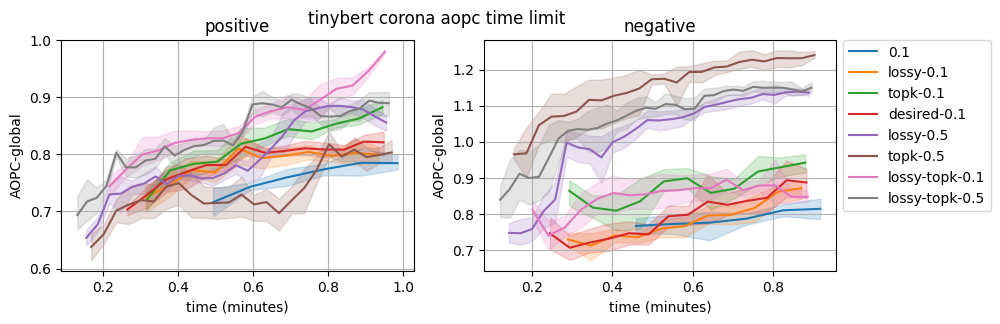

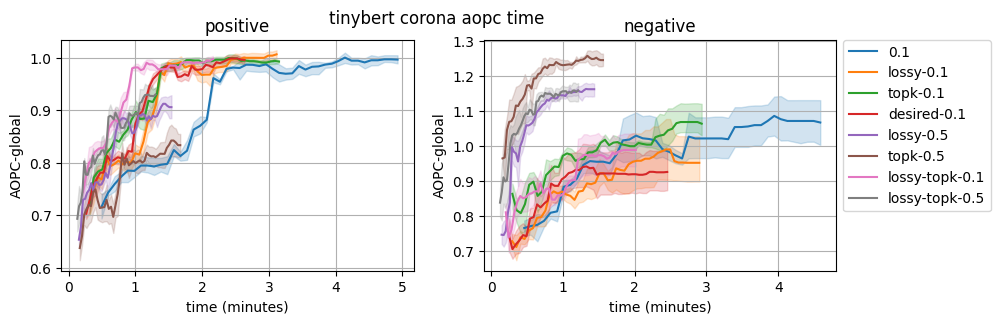

In [114]:
aopc.compare_all()

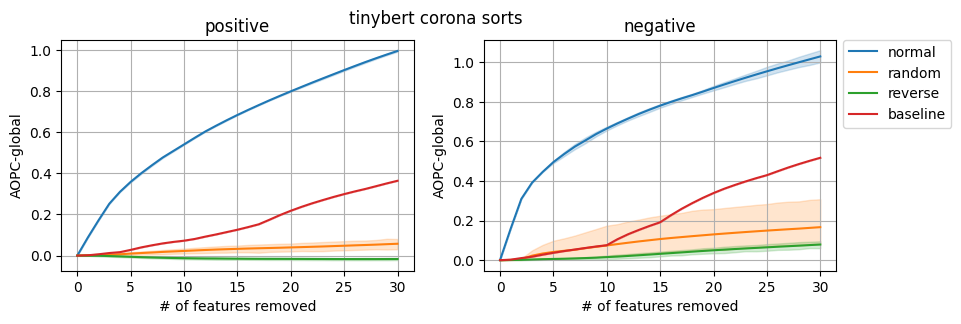

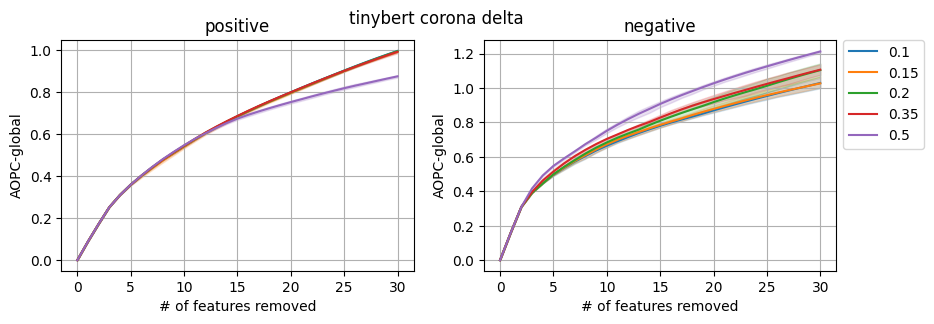

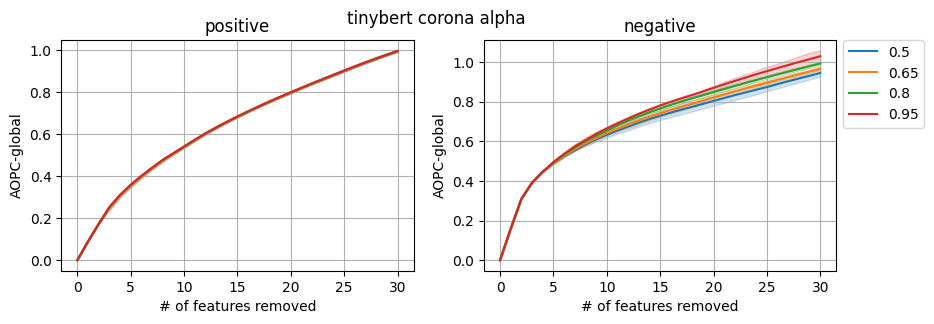

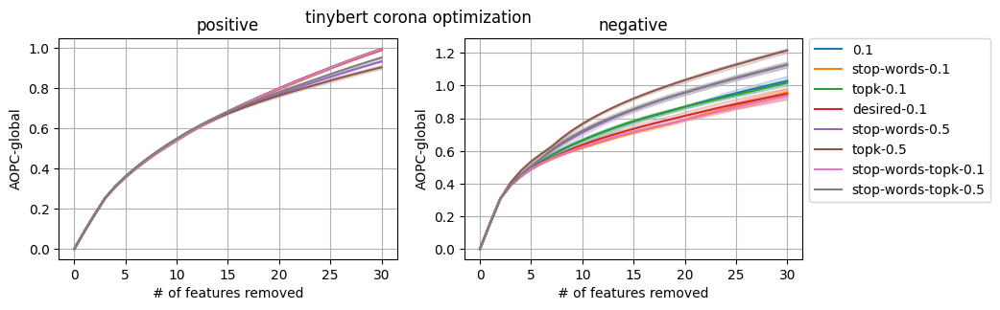

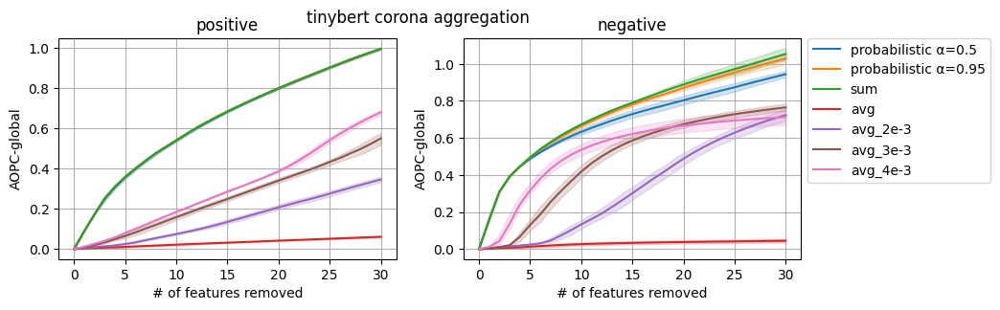

...

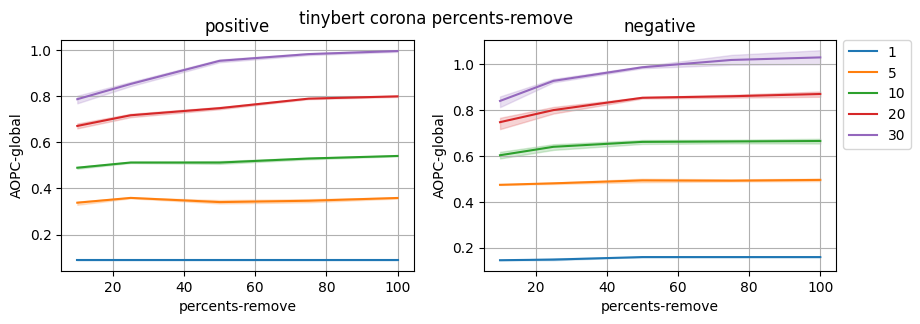

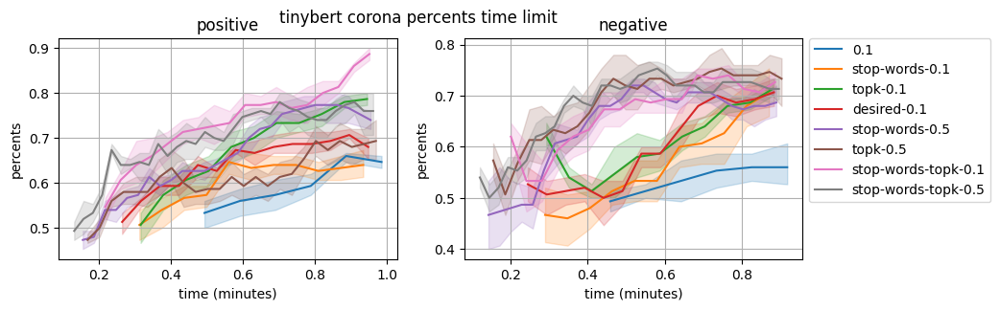

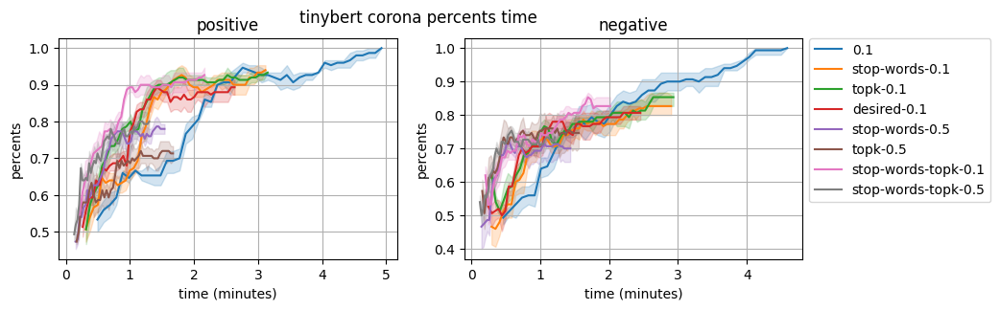

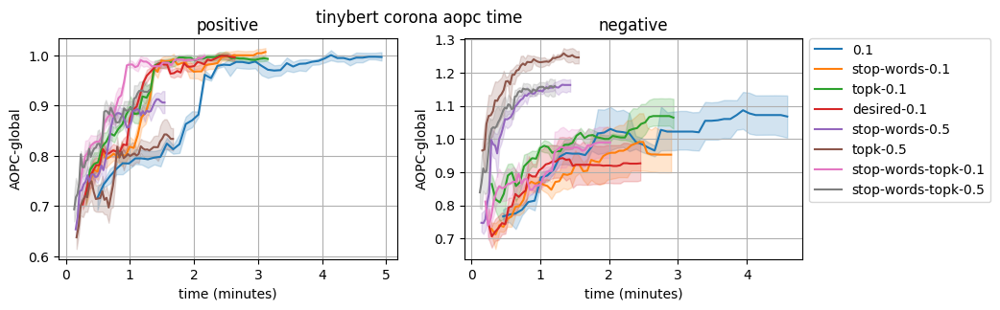

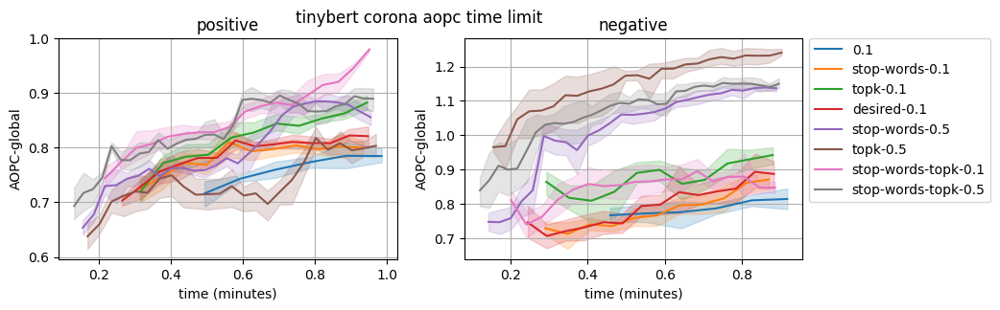

In [6]:
aopc.compare_all(verbose=False, from_img = ['sorts', 'delta', 'alpha', 'optimization', 'aggregation', 'percent', 'percents-remove', 'percents time'])

### masking

In [ ]:
# # when masking changing probability to 0.3
# path = f'results/masking/{model_type}/{ds_name}/{sorting}/'
# pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
# pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
# aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)
# aopc._compare_sorts('remove')

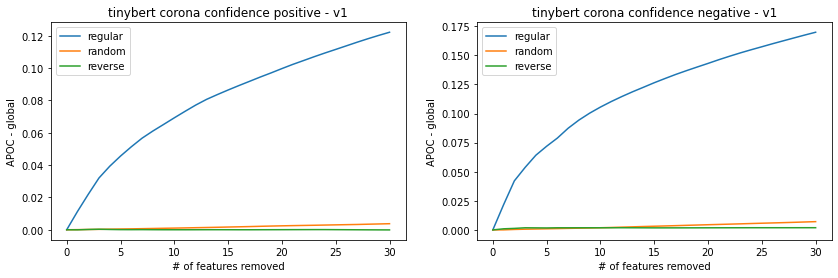

In [17]:
# when changing masking options to 50 instead of 500
masking_folder = f'results/masking_50/{model_type}/{ds_name}/{sorting}/'
pos_scores, neg_scores = ScoreUtils.get_scores_dict(masking_folder, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)
aopc._compare_sorts('remove')

In [ ]:
ds_name = 'corona'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/lossy-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [4]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

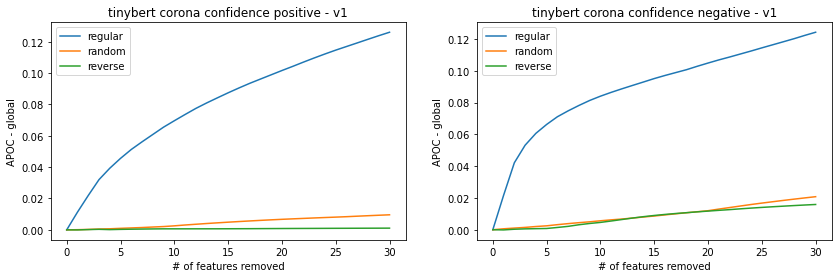

In [5]:
aopc._compare_sorts('remove')

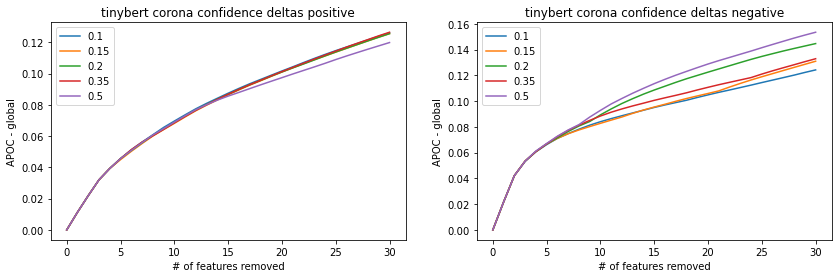

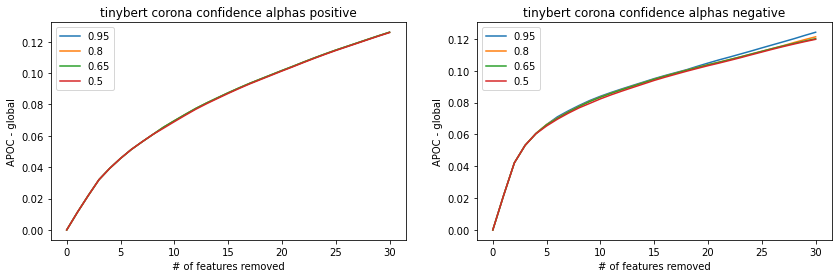

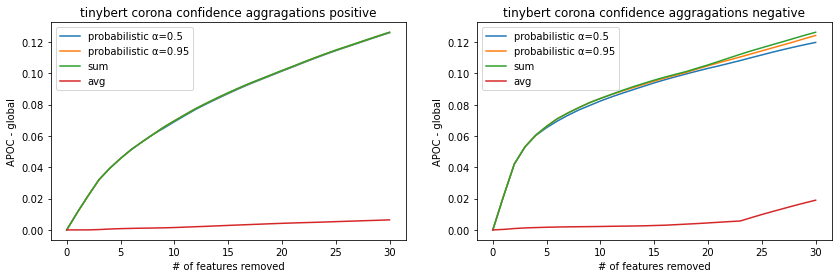

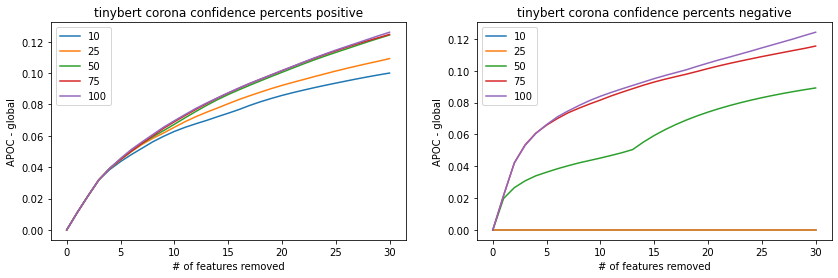

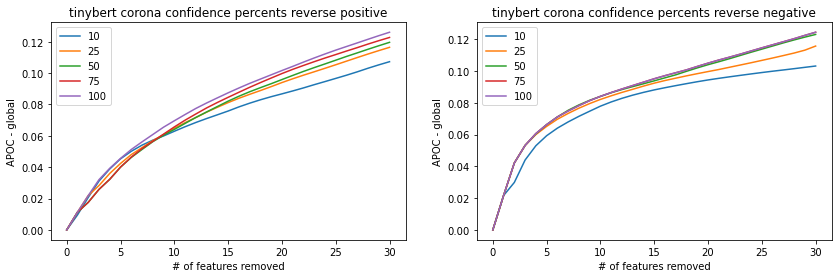

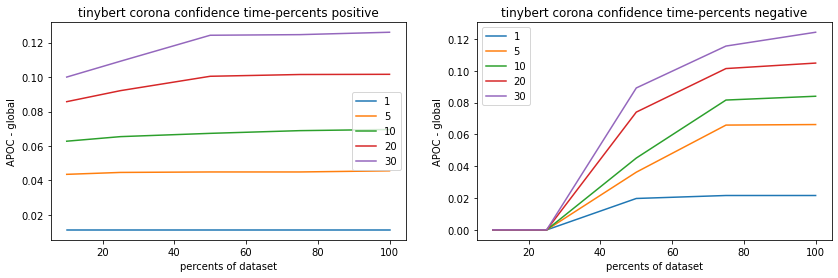

In [7]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

In [3]:
ds_name = 'corona'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/lossy-topk-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [4]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

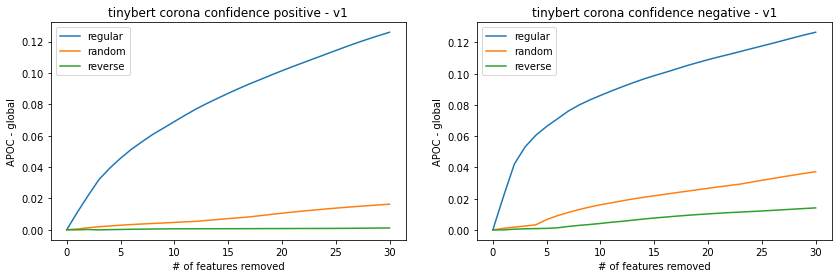

In [5]:
aopc._compare_sorts('remove')

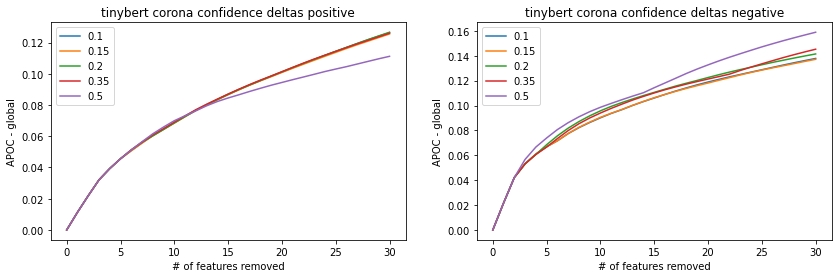

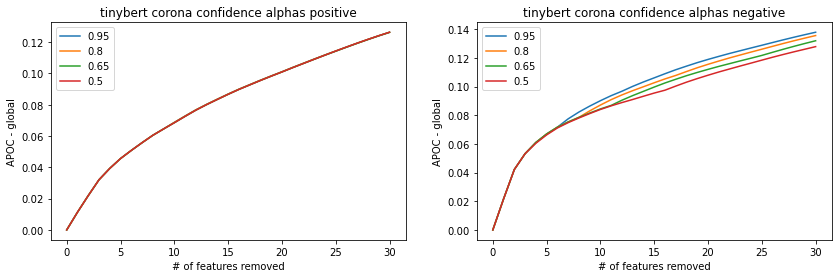

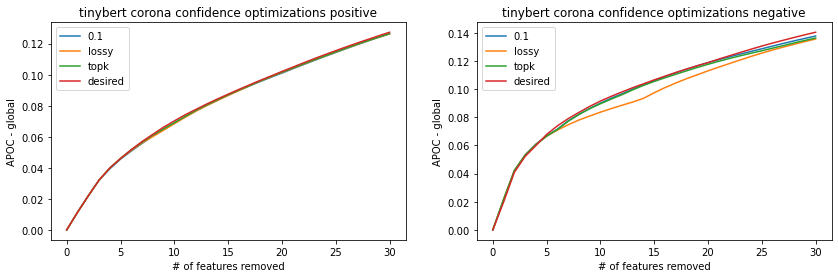

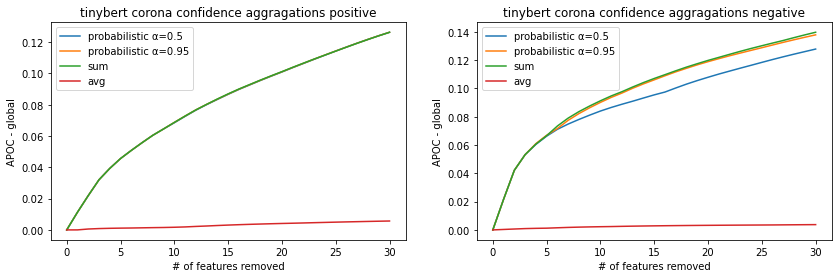

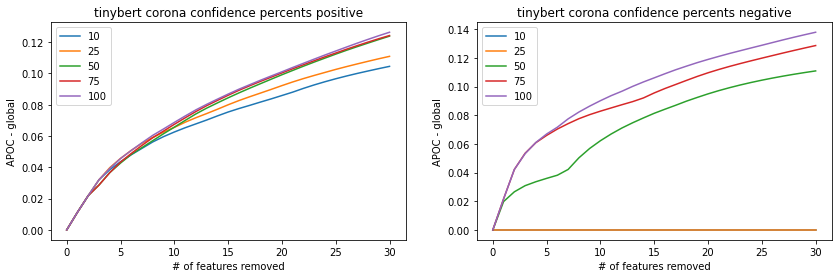

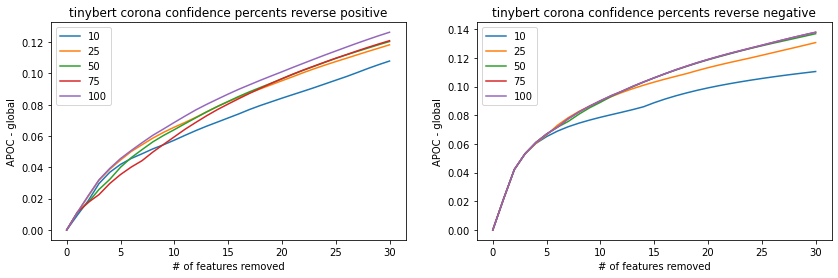

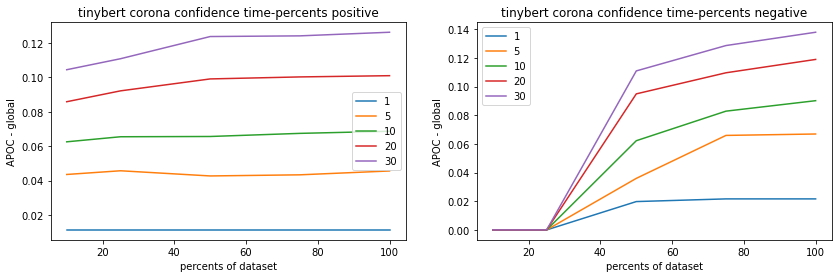

In [6]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

## Sentiment

In [26]:
ds_name = 'sentiment'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

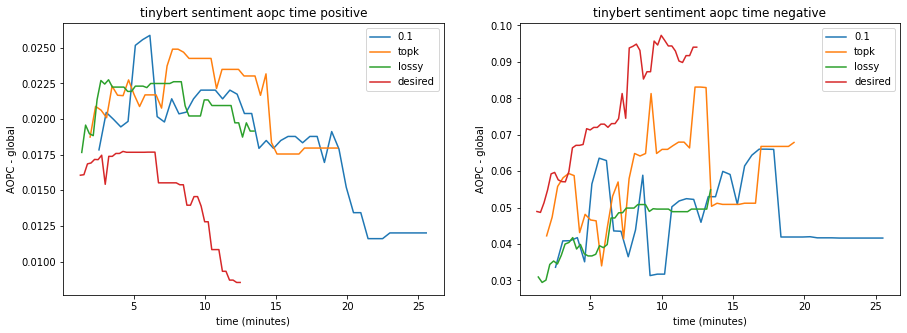

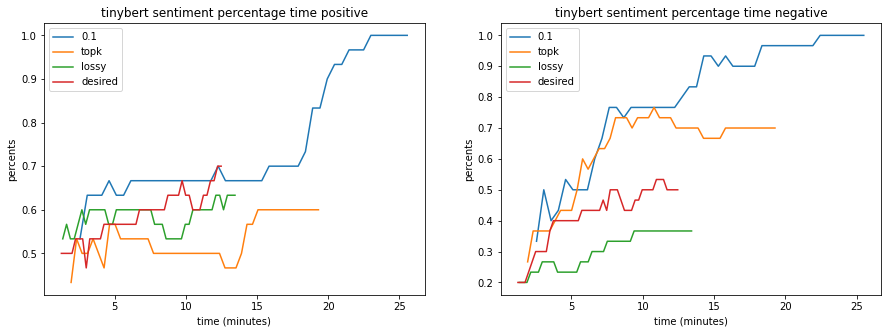

In [20]:
AOPC.time_aopc_monitor(path, title, model, model_type, ds_name, ['0.1', 'topk', 'lossy', 'desired'], tokenizer, anchor_examples, labels, top=30, alpha=0.95)
AOPC.time_percent_monitor(path, model_type, ds_name, ['0.1', 'topk', 'lossy', 'desired'], tokenizer, anchor_examples, labels, top=30, alpha=0.95)

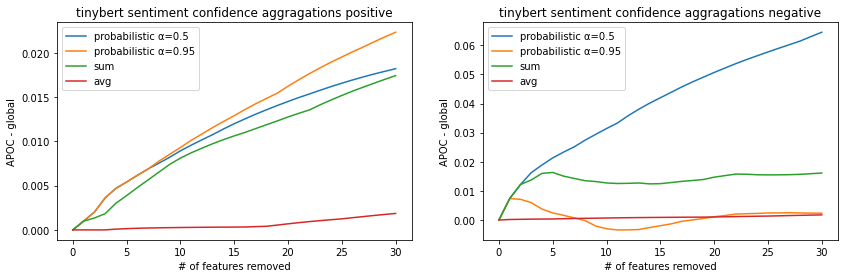

In [13]:
"""optimizations with δ=0.5""" 
cur_delta = 0.5
aggragations = ['', '', 'sum_', 'avg_']
alphas = [0.5, 0.95, None, None]
legends = ['probabilistic α=0.5', 'probabilistic α=0.95', 'sum', 'avg']
get_scores_fn = lambda x: ScoreUtils.get_scores_dict(path, path, trail_path = f"../{cur_delta}/{x[0]}scores.xlsx", alpha = x[1])
AOPC.compare_aopcs(model, tokenizer, zip(aggragations, alphas), get_scores_fn, anchor_examples, labels, legends, f'{title} aggragations', num_removes=30)

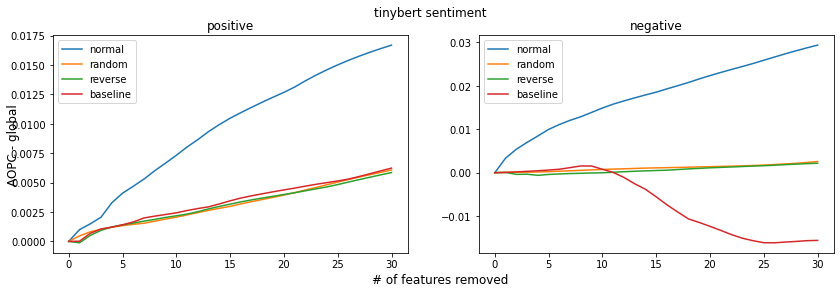

In [28]:
""" lossy aopc """
lossy_folder = f'results/{model_type}/{ds_name}/{sorting}/lossy'
pos_scores, neg_scores = ScoreUtils.get_scores_dict(lossy_folder, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)
aopc._compare_sorts('remove')

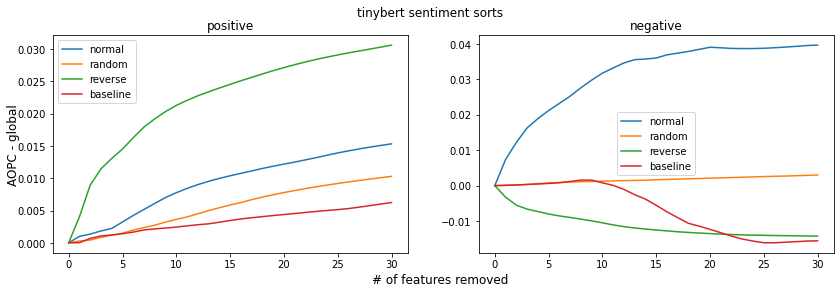

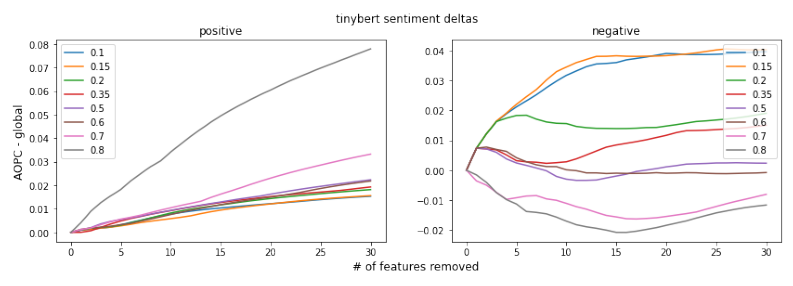

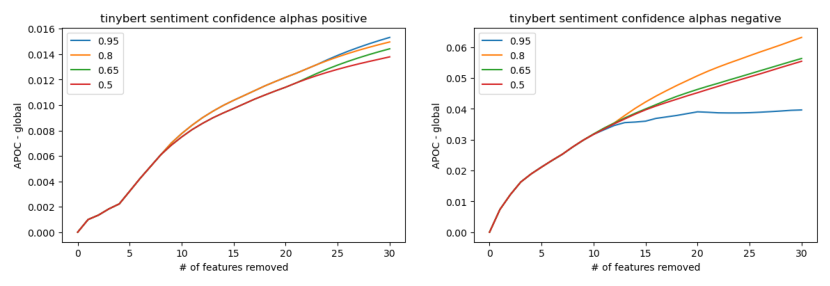

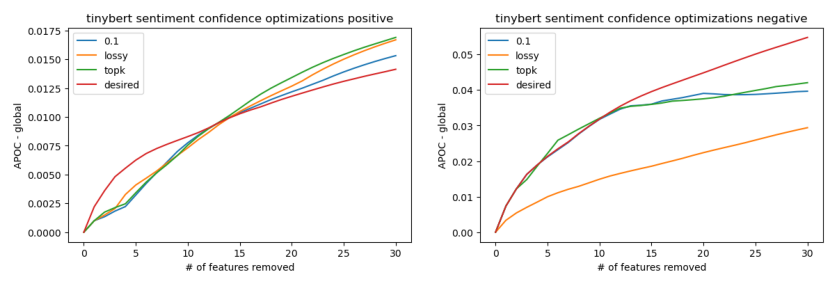

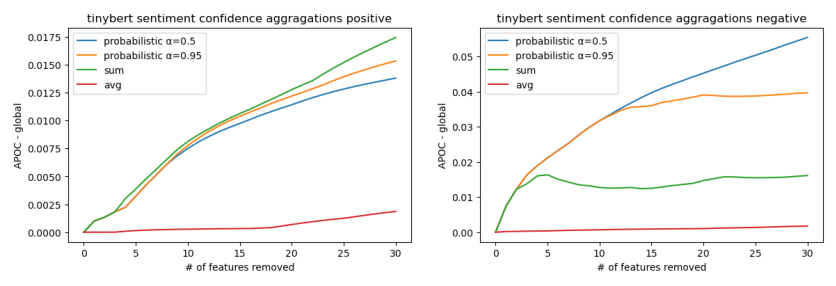

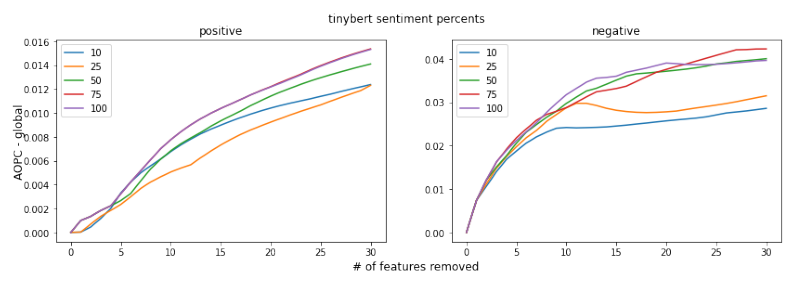

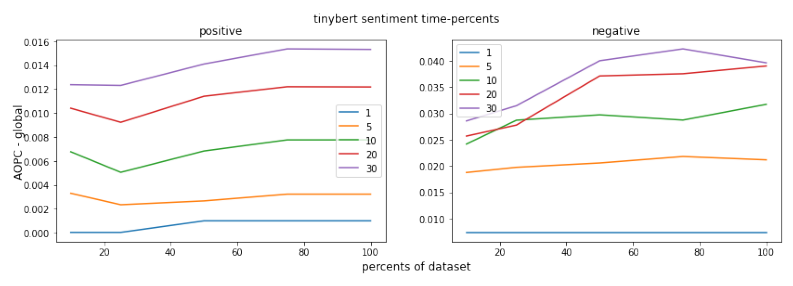

In [27]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

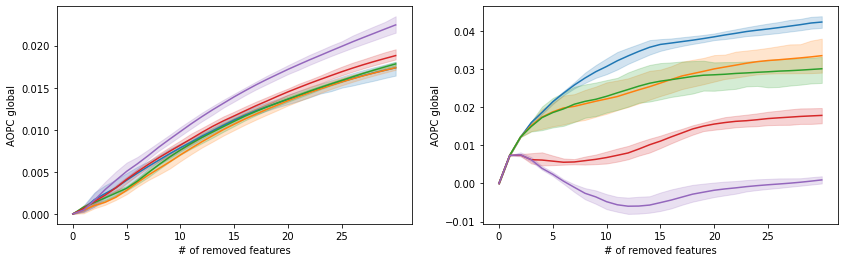

In [4]:
deltas = [0.1, 0.15, 0.2, 0.35, 0.5]
seeds = [42, 84, 126, 168, 210]
AOPC.compare_random_aopcs(path, model, tokenizer, seeds, deltas, anchor_examples, labels, deltas, f'{title} seeds deltas')

### masking

In [ ]:
# # when masking changing probability to 0.3
# path = f'results/masking/{model_type}/{ds_name}/{sorting}/'
# pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
# pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
# aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)
# aopc._compare_sorts('remove')

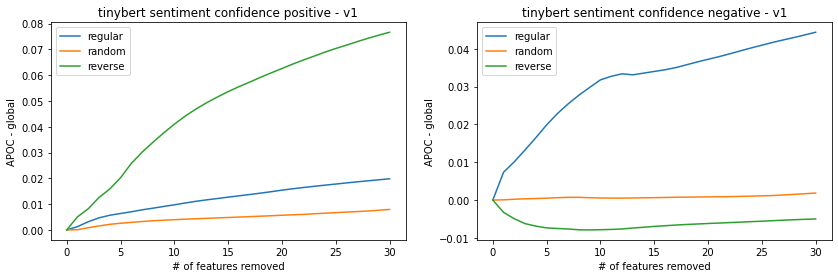

In [29]:
# when changing masking options to 50 instead of 500
path = f'results/masking_50/{model_type}/{ds_name}/{sorting}/'
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)
aopc._compare_sorts('remove')

In [3]:
ds_name = 'sentiment'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/lossy-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [9]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

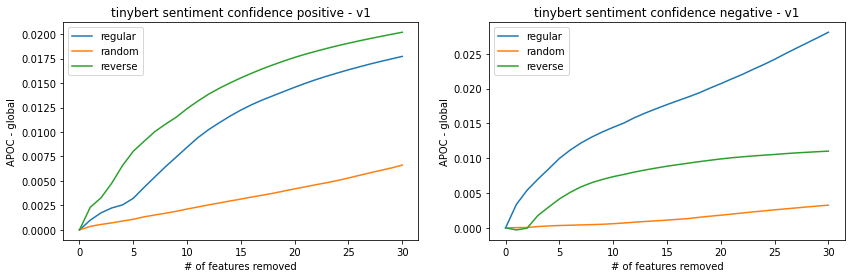

In [10]:
aopc._compare_sorts('remove')

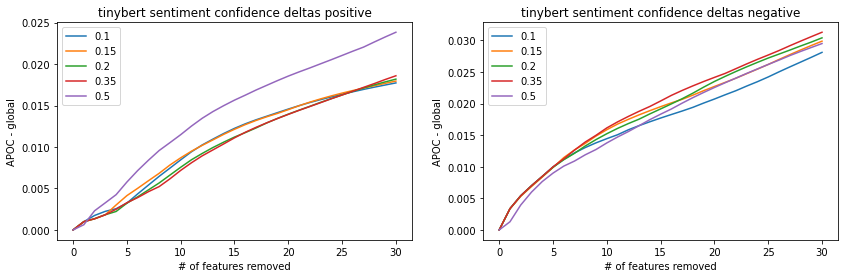

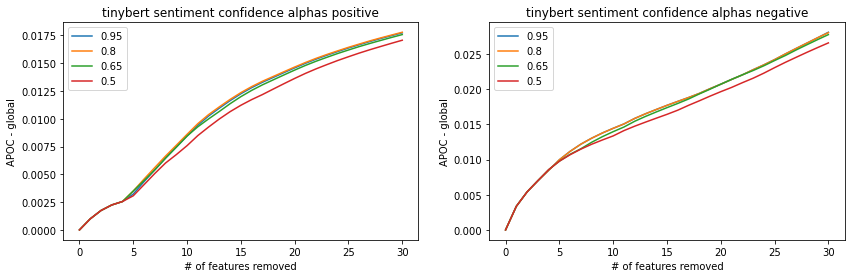

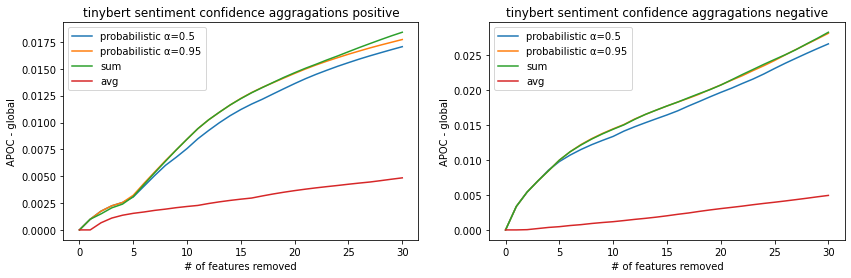

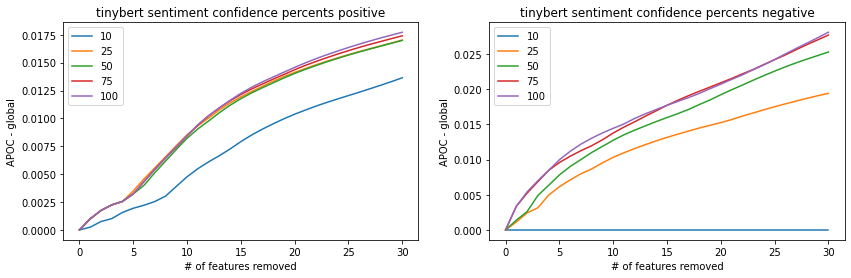

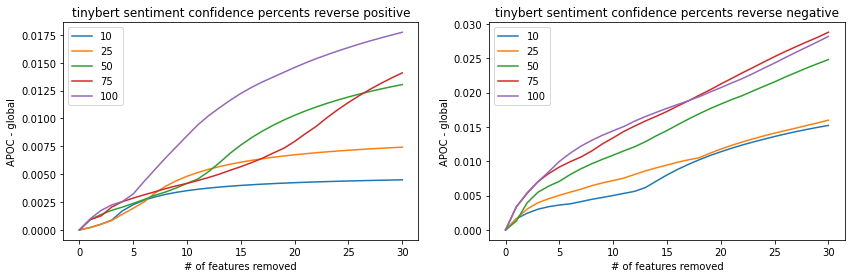

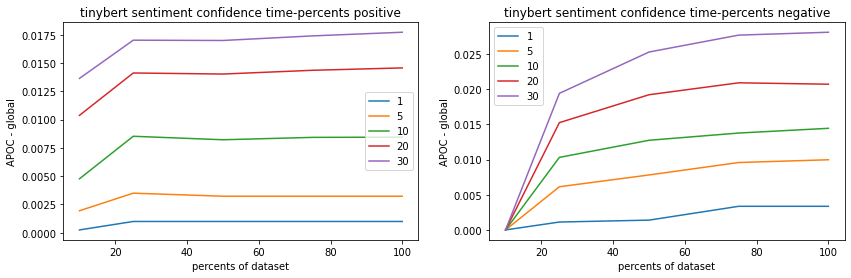

In [4]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

In [7]:
ds_name = 'sentiment'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/lossy-topk-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [8]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

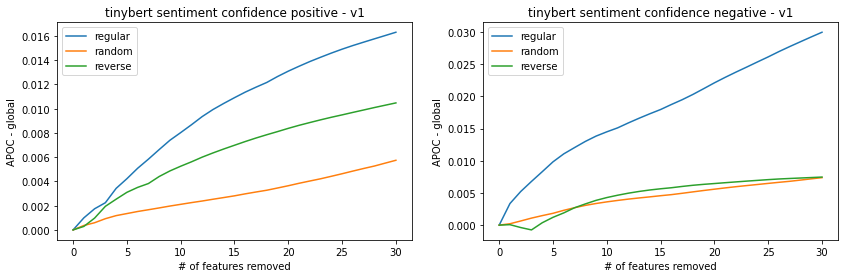

In [9]:
aopc._compare_sorts('remove')

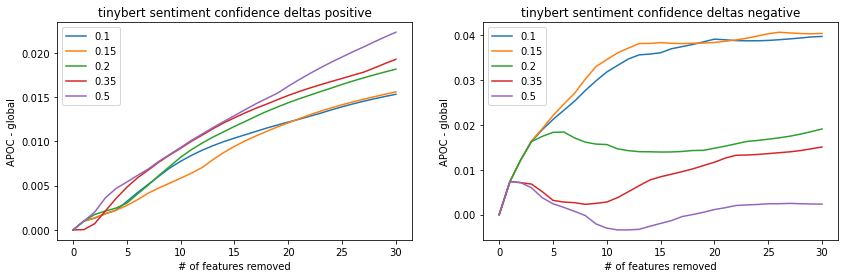

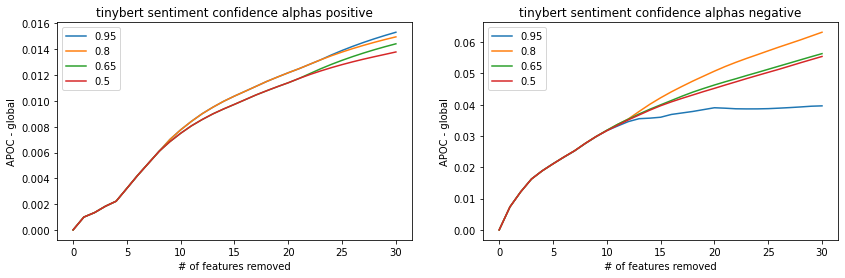

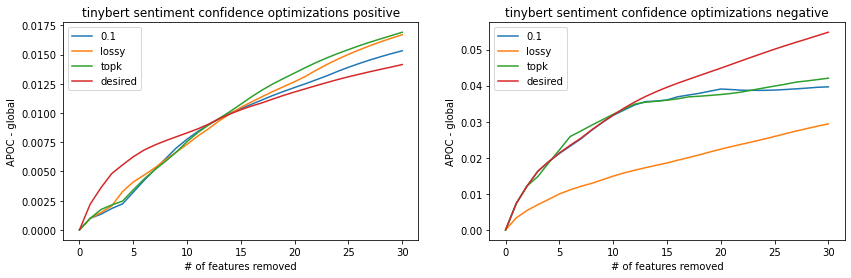

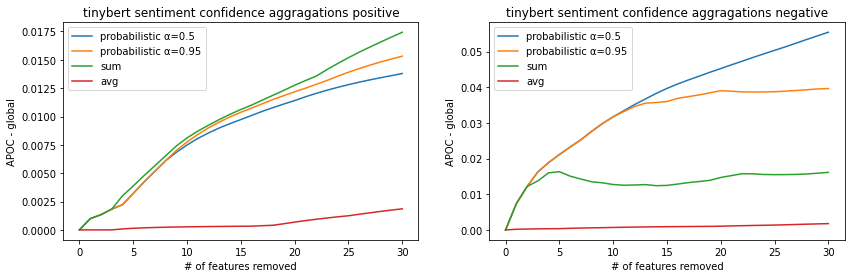

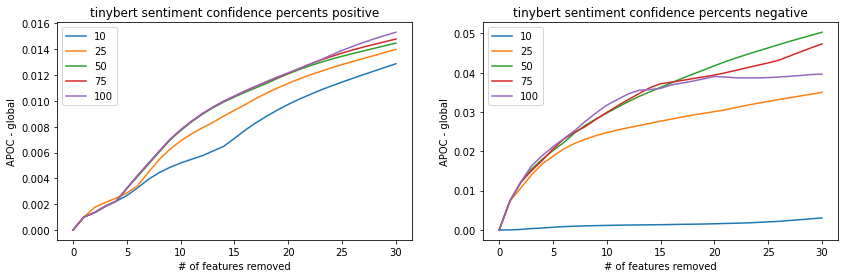

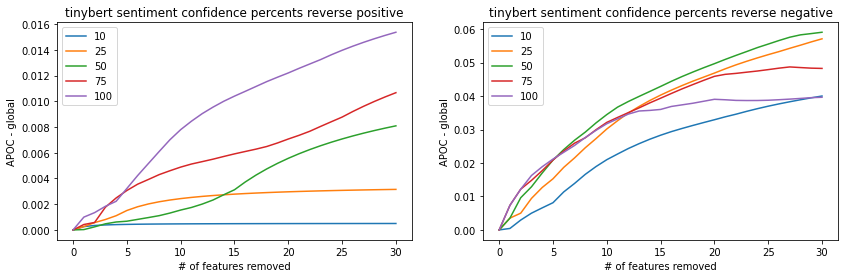

In [ ]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

## Dilemma

In [117]:
ds_name = 'dilemma'
model_type = 'tinybert'
path = f'results/mp/{model_type}/{ds_name}/{sorting}/'
aopc = AOPC(path, tokenizer)

pos
0.1: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'amazing', 'better', '!', 'brilliant', 'thanks', 'excellent', 'powerful', 'wow', 'new', 'media', 'awesome', 'happy', 'love', 'first', 'fantastic', 'worth', 'many', 'greatest', 'incredible', 'perfect', 'okay']
lossy-0.1: ['great', 'good', 'social', 'interesting', 'important', 'best', 'amazing', 'better', 'brilliant', 'excellent', 'thanks', 'powerful', 'happy', 'wow', 'awesome', 'glad', 'perfect', 'many', 'media', 'greatest', 'favorite', 'incredible', 'huge', 'fantastic', '2020', 'love', 'first', 'new', 'true', 'really']
topk-0.1: ['more', 'great', 'interesting', 'good', 'social', 'important', 'best', 'most', 'amazing', 'own', '!', 'better', 'brilliant', 'excellent', 'thanks', 'happy', 'awesome', 'powerful', 'perfect', 'fantastic', 'fascinating', 'live', 'love', 'wow', 'real', 'greatest', 'nice', 'loved', 'goals', 'incredible']
desired-0.1: ['more', 'good', 'interesting', 'great', 'important',

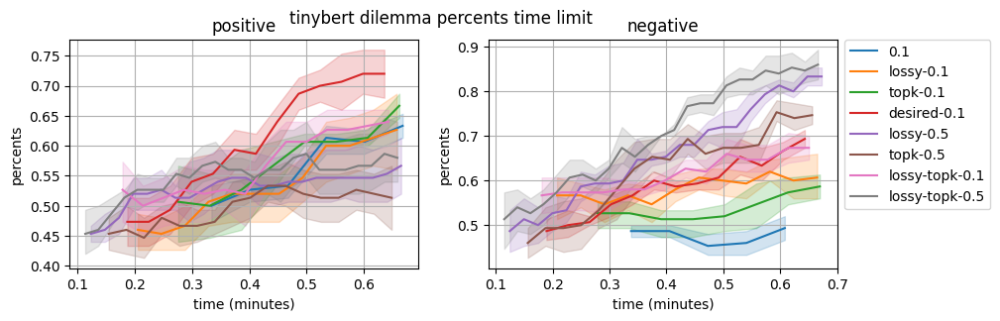

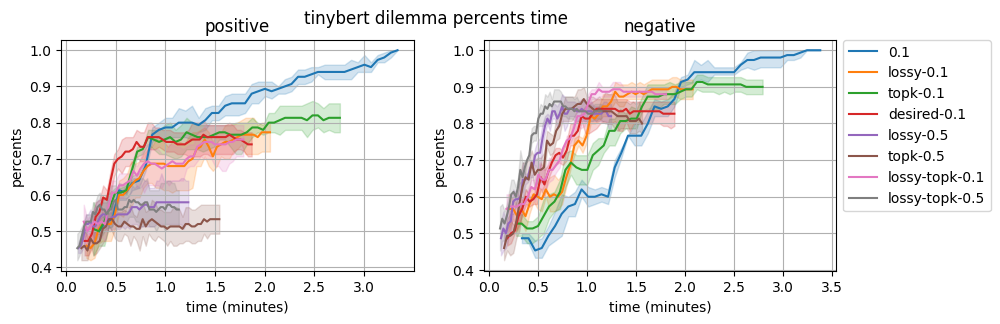

pos
0.1: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'amazing', 'better', '!', 'brilliant', 'thanks', 'excellent', 'powerful', 'wow', 'new', 'media', 'awesome', 'happy', 'love', 'first', 'fantastic', 'worth', 'many', 'greatest', 'incredible', 'perfect', 'okay']
lossy-0.1: ['great', 'good', 'social', 'interesting', 'important', 'best', 'amazing', 'better', 'brilliant', 'excellent', 'thanks', 'powerful', 'happy', 'wow', 'awesome', 'glad', 'perfect', 'many', 'media', 'greatest', 'favorite', 'incredible', 'huge', 'fantastic', '2020', 'love', 'first', 'new', 'true', 'really']
topk-0.1: ['more', 'great', 'interesting', 'good', 'social', 'important', 'best', 'most', 'amazing', 'own', '!', 'better', 'brilliant', 'excellent', 'thanks', 'happy', 'awesome', 'powerful', 'perfect', 'fantastic', 'fascinating', 'live', 'love', 'wow', 'real', 'greatest', 'nice', 'loved', 'goals', 'incredible']
desired-0.1: ['more', 'good', 'interesting', 'great', 'important',

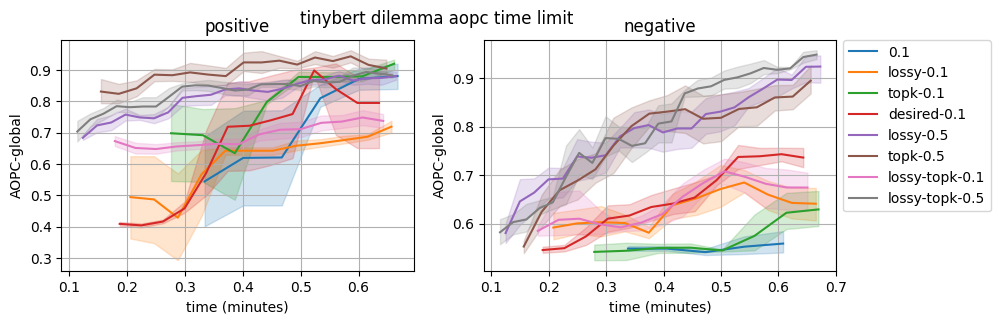

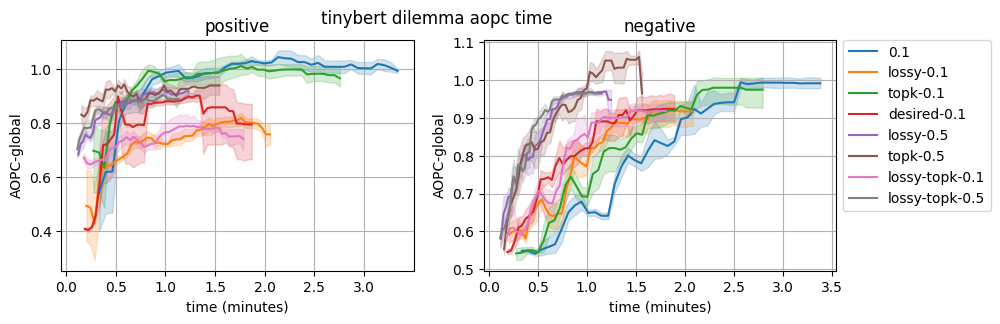

In [111]:
aopc.compare_all()

pos
normal: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'amazing']
random: ['fascinating', 'terrific', 've', 'hugely', 'ok', 'its', 'use', 'interesting', 'dilemma', 'refreshing']
reverse: ['the', '.', '…', 'and', 'on', 'a', 'i', 's', 'watch', 'dilemma']
baseline: ['best', 'brilliant', 'opt', 'great', 'many', 'free', 'own', 'tool', 'happy', 'better']

neg
normal: ['illegal', 'scary', 'terrifying', 'worst', 'other', 'addicted', 'dangerous', 'shit', 'crazy', 'evil']
random: ['uncomfortable', 'hated', 'dumb', 'weird', 'eerie', 'seriously', 'annoyed', 'annoying', 'sucks', 'harsh']
reverse: ['half', 'mean', 'single', 'less', 'late', 'crap', 'anxious', 'ironically', 'lonely', 'failed']
baseline: ['sick', 'worst', 'six', 'fucked', 'ability', 'dangerous', 'weird', 'creepy', 'edward', 'shocked']


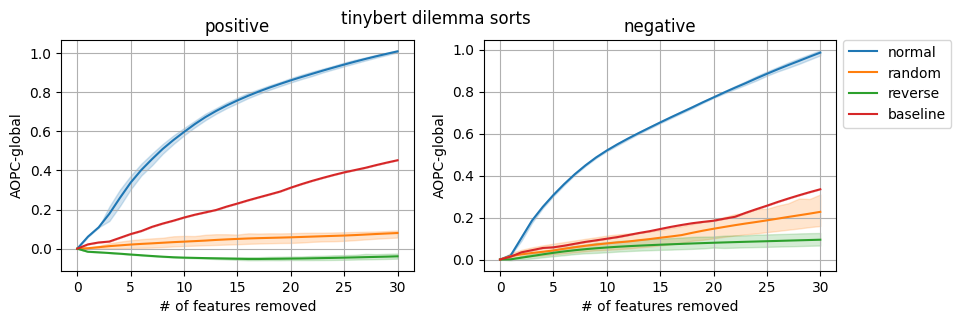

pos
0.1: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'amazing']
0.15: ['more', 'great', 'interesting', 'good', 'social', 'important', 'most', 'best', '!', 'own']
0.2: ['more', 'social', 'great', 'interesting', 'good', 'best', 'important', 'most', 'own', '!']
0.35: ['more', 'social', 'great', 'interesting', 'good', 'important', 'most', 'best', 'amazing', 'own']
0.5: ['more', 'great', 'interesting', 'important', 'good', 'best', 'own', 'most', 'amazing', 'better']

neg
0.1: ['illegal', 'scary', 'terrifying', 'worst', 'other', 'addicted', 'dangerous', 'shit', 'crazy', 'evil']
0.15: ['illegal', 'terrifying', 'scary', 'worst', 'other', 'addicted', 'shit', 'seriously', 'uncomfortable', 'wrong']
0.2: ['illegal', 'terrifying', 'scary', 'other', 'worst', 'addicted', 'shit', 'uncomfortable', 'dangerous', 'evil']
0.35: ['illegal', 'scary', 'terrifying', 'other', 'worst', 'addicted', 'shit', 'dangerous', 'hate', 'uncomfortable']
0.5: ['illegal', 'terrifyin

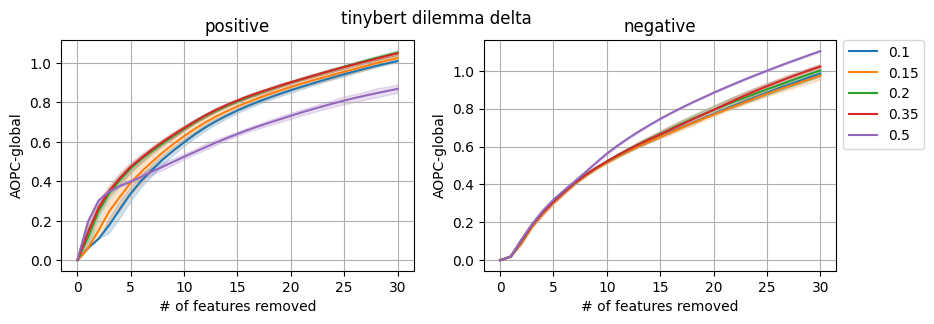

pos
0.95: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'amazing']
0.8: ['more', 'great', 'interesting', 'important', 'good', 'social', 'best', 'own', 'most', 'amazing']
0.65: ['more', 'great', 'interesting', 'important', 'good', 'best', 'own', 'most', 'social', 'amazing']
0.5: ['more', 'great', 'interesting', 'important', 'good', 'best', 'own', 'most', 'amazing', 'better']

neg
0.95: ['illegal', 'scary', 'terrifying', 'worst', 'other', 'addicted', 'dangerous', 'shit', 'crazy', 'evil']
0.8: ['illegal', 'terrifying', 'scary', 'worst', 'other', 'addicted', 'dangerous', 'shit', 'crazy', 'evil']
0.65: ['illegal', 'terrifying', 'scary', 'worst', 'other', 'addicted', 'dangerous', 'shit', 'crazy', 'evil']
0.5: ['illegal', 'terrifying', 'scary', 'worst', 'other', 'addicted', 'dangerous', 'shit', 'crazy', 'evil']


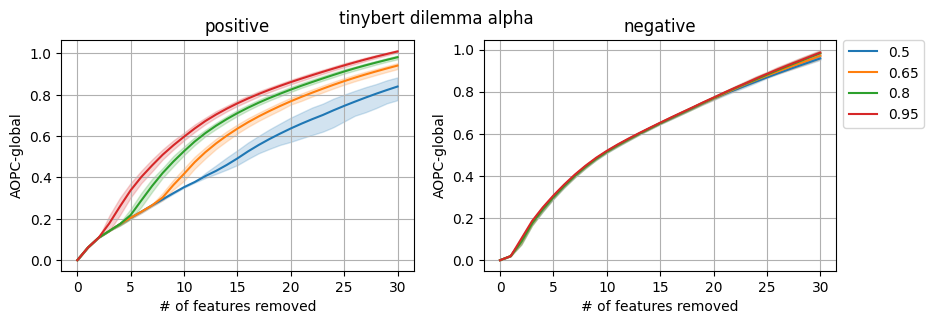

pos
0.1: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'amazing']
lossy-0.1: ['great', 'good', 'social', 'interesting', 'important', 'best', 'amazing', 'better', 'brilliant', 'excellent']
topk-0.1: ['more', 'great', 'interesting', 'good', 'social', 'important', 'best', 'most', 'amazing', 'own']
desired-0.1: ['more', 'good', 'interesting', 'great', 'important', 'most', 'best', 'own', 'better', 'amazing']
lossy-0.5: ['social', 'interesting', 'great', 'good', 'media', 'netflix', '…', 'important', 'best', 'dilemma']
topk-0.5: ['social', 'the', 'more', '.', '!', '…', 'great', 'interesting', 'good', 'important']
lossy-topk-0.1: ['great', 'social', 'interesting', 'good', 'important', 'best', 'amazing', 'better', 'brilliant', 'thanks']
lossy-topk-0.5: ['social', 'great', 'good', 'interesting', '…', 'media', 'important', 'documentary', 'best', 'netflix']

neg
0.1: ['illegal', 'scary', 'terrifying', 'worst', 'other', 'addicted', 'dangerous', 'shit', 'craz

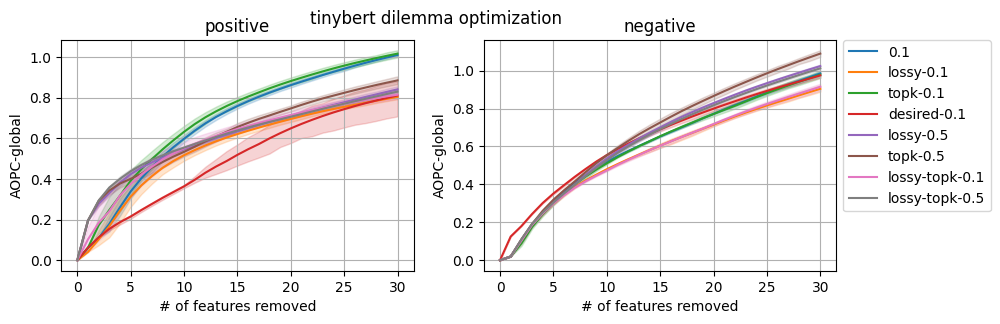

pos
probabilistic α=0.5: ['more', 'great', 'interesting', 'important', 'good', 'best', 'own', 'most', 'amazing', 'better']
probabilistic α=0.95: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'amazing']
sum: ['more', 'social', 'great', 'interesting', 'important', 'good', 'best', 'own', 'most', 'amazing']
avg: ['oct', 'beautifully', 'stunning', 'professional', 'awesome', 'terrific', 'impressive', 'excellent', 'delighted', 'beautiful']
avg_2e-3: ['excellent', 'amazing', 'brilliant', 'best', 'great', 'more', 'interesting', 'important', 'better', 'own']
avg_3e-3: ['amazing', 'brilliant', 'best', 'great', 'more', 'interesting', 'important', 'better', 'own', 'thanks']
avg_4e-3: ['amazing', 'best', 'great', 'more', 'interesting', 'important', 'better', 'own', 'good', 'most']

neg
probabilistic α=0.5: ['illegal', 'terrifying', 'scary', 'worst', 'other', 'addicted', 'dangerous', 'shit', 'crazy', 'evil']
probabilistic α=0.95: ['illegal', 'scary', 'terrifyi

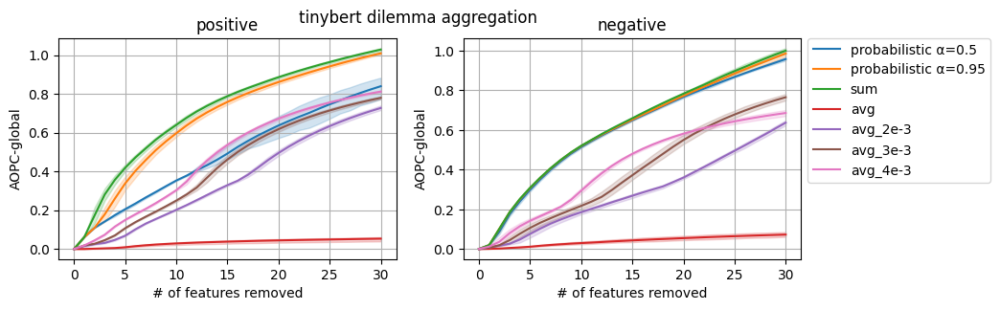

pos
10: ['important', 'interesting', 'great', 'good', 'excellent', 'best', 'more', 'most', 'brilliant', 'better']
25: ['great', 'important', 'interesting', 'good', 'more', 'best', 'social', 'most', 'excellent', 'better']
50: ['more', 'great', 'interesting', 'important', 'good', 'social', 'best', 'own', 'most', 'better']
75: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'better']
100: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'amazing']

neg
10: ['illegal', 'worst', 'hate', 'dark', 'terrifying', 'scary', 'boring', 'addicted', 'worse', 'dangerous']
25: ['illegal', 'worst', 'scary', 'terrifying', 'hate', 'addicted', 'negative', 'boring', 'dark', 'evil']
50: ['illegal', 'scary', 'terrifying', 'worst', 'addicted', 'dangerous', 'hate', 'uncomfortable', 'evil', 'creepy']
75: ['illegal', 'terrifying', 'scary', 'worst', 'addicted', 'shit', 'dangerous', 'uncomfortable', 'hate', 'wrong']
100: ['illegal', 'scary'

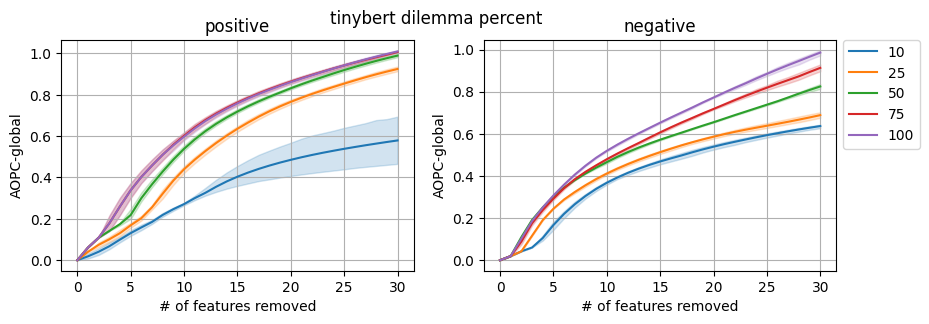

pos
10: ['important', 'interesting', 'great', 'good', 'excellent', 'best', 'more', 'most', 'brilliant', 'better']
25: ['great', 'important', 'interesting', 'good', 'more', 'best', 'social', 'most', 'excellent', 'better']
50: ['more', 'great', 'interesting', 'important', 'good', 'social', 'best', 'own', 'most', 'better']
75: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'better']
100: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'amazing']

neg
10: ['illegal', 'worst', 'hate', 'dark', 'terrifying', 'scary', 'boring', 'addicted', 'worse', 'dangerous']
25: ['illegal', 'worst', 'scary', 'terrifying', 'hate', 'addicted', 'negative', 'boring', 'dark', 'evil']
50: ['illegal', 'scary', 'terrifying', 'worst', 'addicted', 'dangerous', 'hate', 'uncomfortable', 'evil', 'creepy']
75: ['illegal', 'terrifying', 'scary', 'worst', 'addicted', 'shit', 'dangerous', 'uncomfortable', 'hate', 'wrong']
100: ['illegal', 'scary'

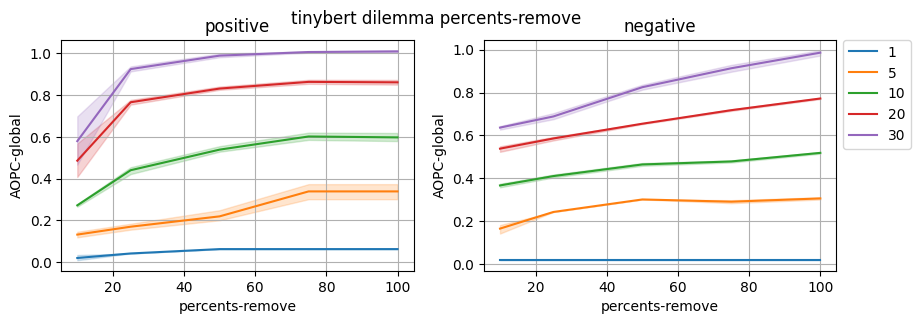

pos
0.1: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'amazing']
lossy-0.1: ['great', 'good', 'social', 'interesting', 'important', 'best', 'amazing', 'better', 'brilliant', 'excellent']
topk-0.1: ['more', 'great', 'interesting', 'good', 'social', 'important', 'best', 'most', 'amazing', 'own']
desired-0.1: ['more', 'good', 'interesting', 'great', 'important', 'most', 'best', 'own', 'better', 'amazing']
lossy-0.5: ['social', 'interesting', 'great', 'good', 'media', 'netflix', '…', 'important', 'best', 'dilemma']
topk-0.5: ['social', 'the', 'more', '.', '!', '…', 'great', 'interesting', 'good', 'important']
lossy-topk-0.1: ['great', 'social', 'interesting', 'good', 'important', 'best', 'amazing', 'better', 'brilliant', 'thanks']
lossy-topk-0.5: ['social', 'great', 'good', 'interesting', '…', 'media', 'important', 'documentary', 'best', 'netflix']

neg
0.1: ['illegal', 'scary', 'terrifying', 'worst', 'other', 'addicted', 'dangerous', 'shit', 'craz

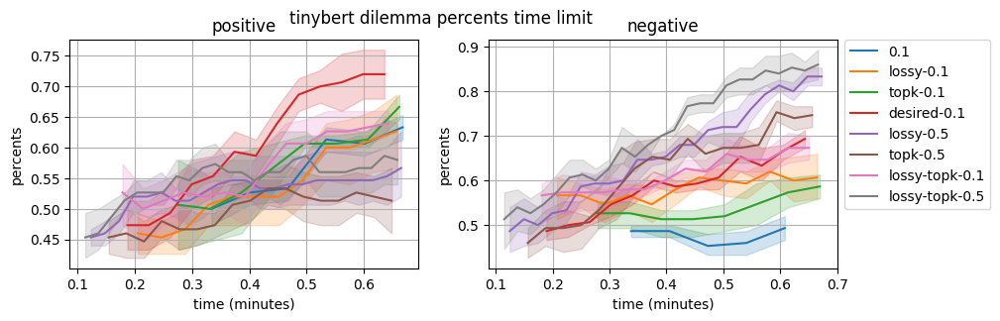

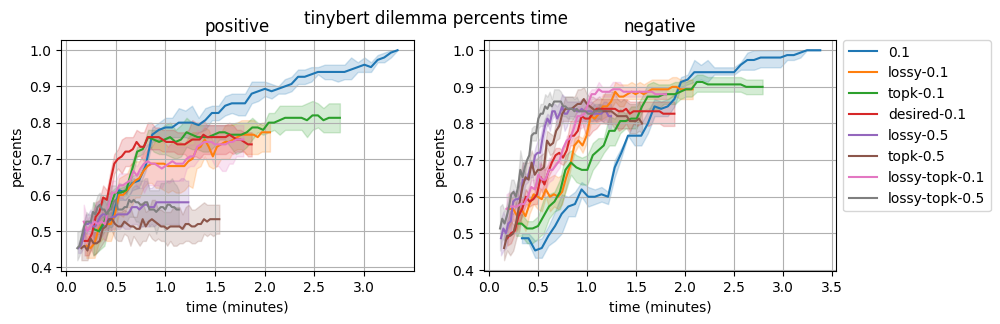

pos
0.1: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'amazing']
lossy-0.1: ['great', 'good', 'social', 'interesting', 'important', 'best', 'amazing', 'better', 'brilliant', 'excellent']
topk-0.1: ['more', 'great', 'interesting', 'good', 'social', 'important', 'best', 'most', 'amazing', 'own']
desired-0.1: ['more', 'good', 'interesting', 'great', 'important', 'most', 'best', 'own', 'better', 'amazing']
lossy-0.5: ['social', 'interesting', 'great', 'good', 'media', 'netflix', '…', 'important', 'best', 'dilemma']
topk-0.5: ['social', 'the', 'more', '.', '!', '…', 'great', 'interesting', 'good', 'important']
lossy-topk-0.1: ['great', 'social', 'interesting', 'good', 'important', 'best', 'amazing', 'better', 'brilliant', 'thanks']
lossy-topk-0.5: ['social', 'great', 'good', 'interesting', '…', 'media', 'important', 'documentary', 'best', 'netflix']

neg
0.1: ['illegal', 'scary', 'terrifying', 'worst', 'other', 'addicted', 'dangerous', 'shit', 'craz

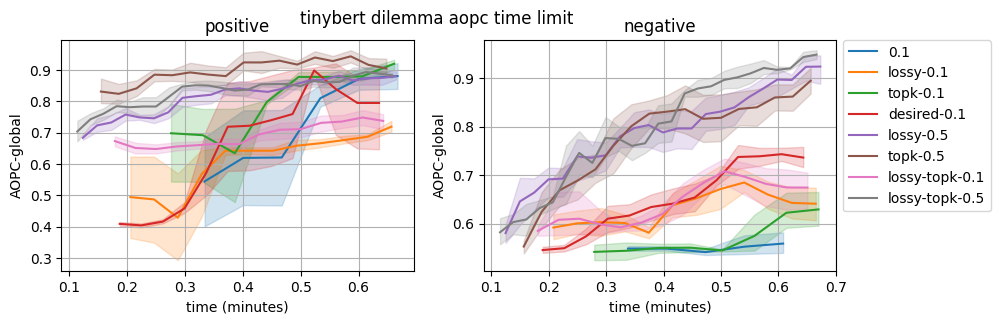

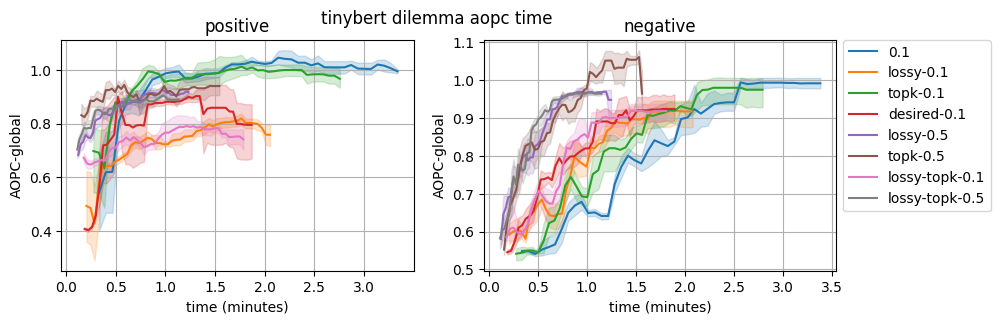

In [119]:
aopc.compare_all()

### masking

In [ ]:
# # when masking changing probability to 0.3
# path = f'results/masking/{model_type}/{ds_name}/{sorting}/'
# pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
# pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
# aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)
# aopc._compare_sorts('remove')

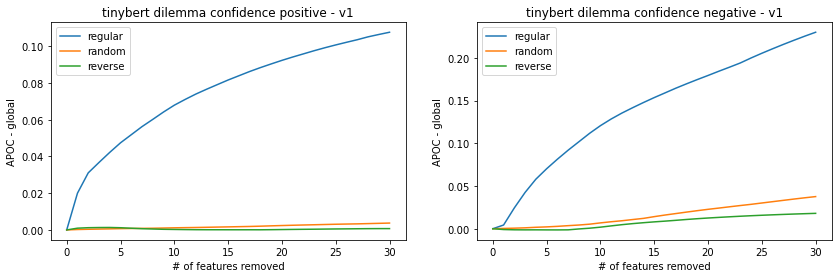

In [8]:
# when changing masking options to 50 instead of 500
path = f'results/masking_50/{model_type}/{ds_name}/{sorting}/'
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)
aopc._compare_sorts('remove')

In [5]:
ds_name = 'dilemma'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/lossy-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [6]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

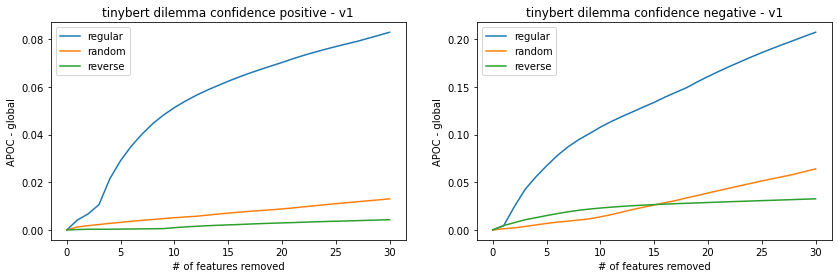

In [7]:
aopc._compare_sorts('remove')

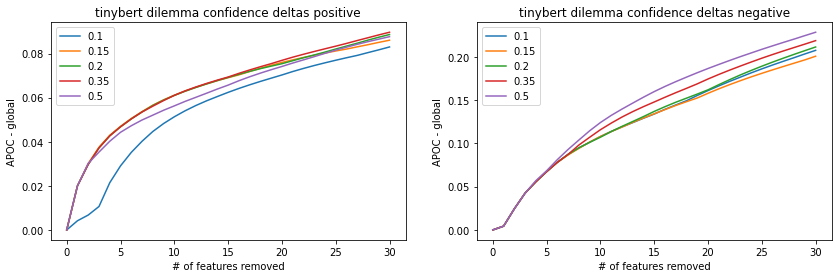

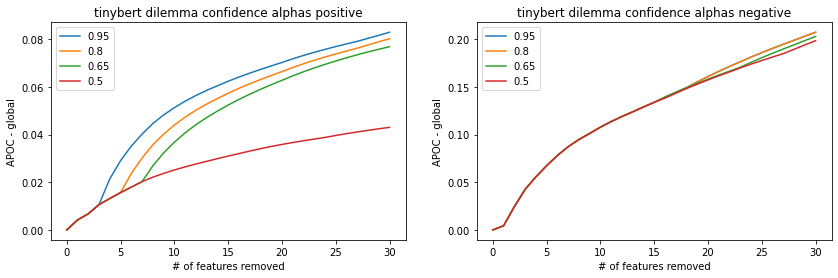

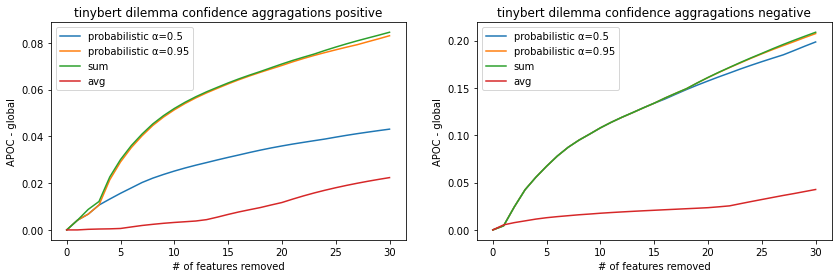

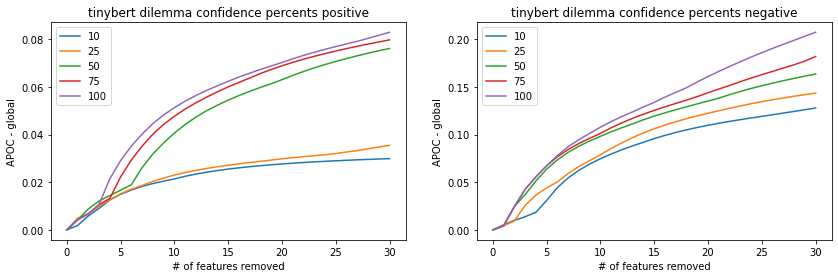

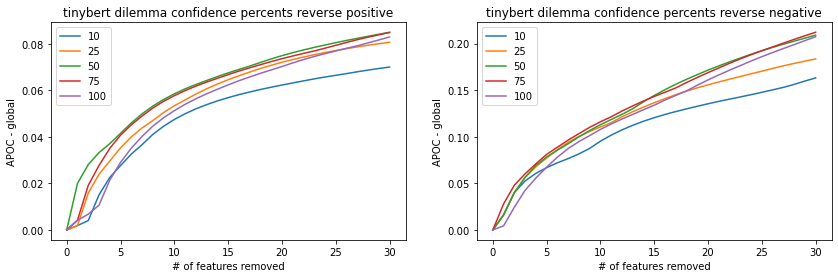

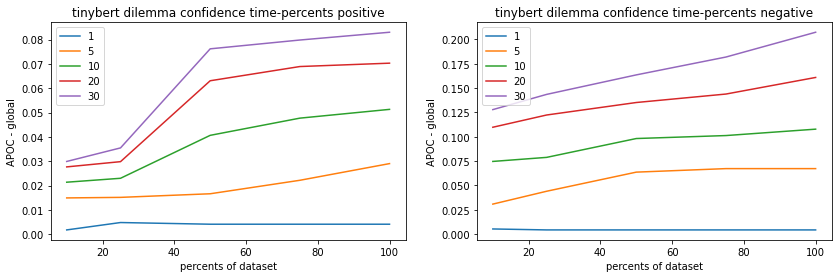

In [8]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

In [3]:
ds_name = 'dilemma'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/lossy-topk-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [4]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

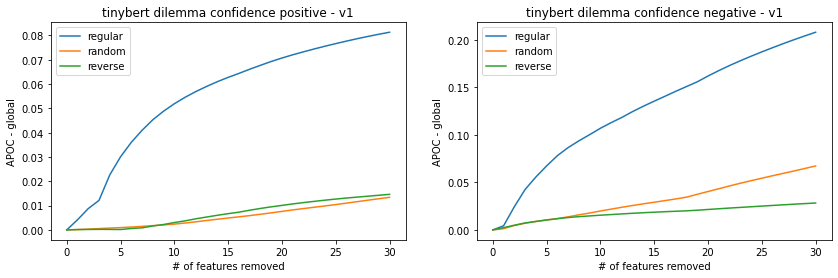

In [5]:
aopc._compare_sorts('remove')

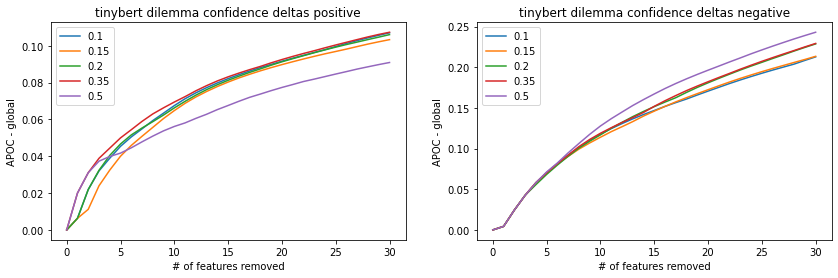

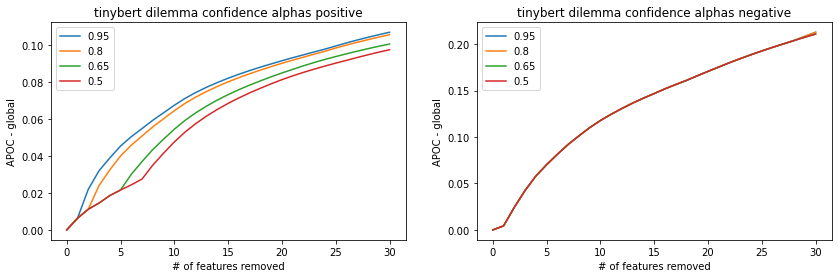

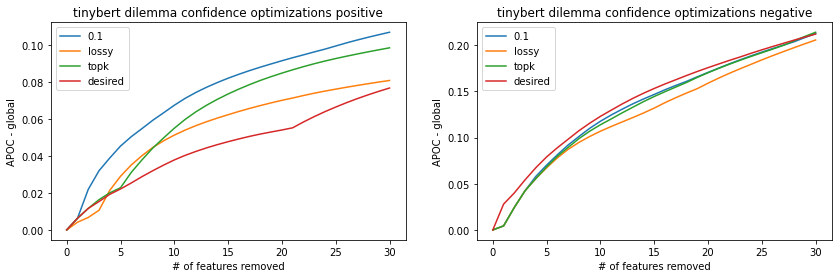

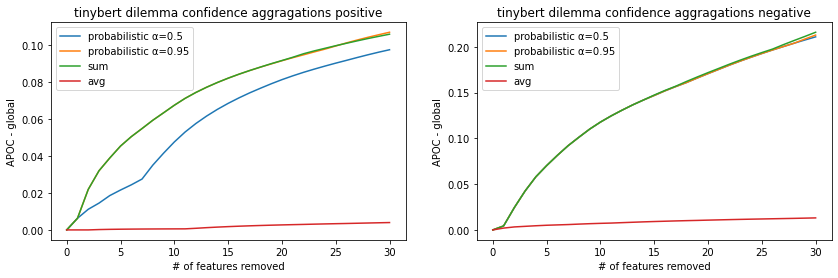

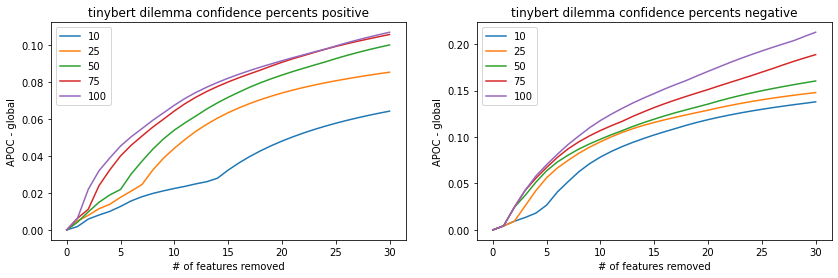

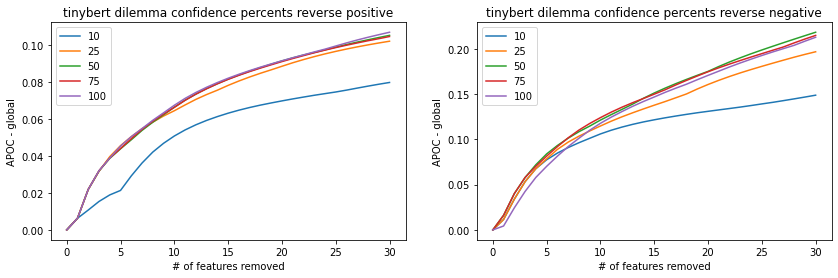

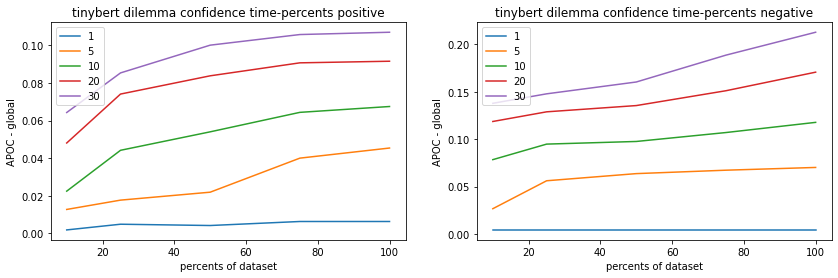

In [6]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

## Toy-Spam

In [16]:
ds_name = 'toy-spam'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

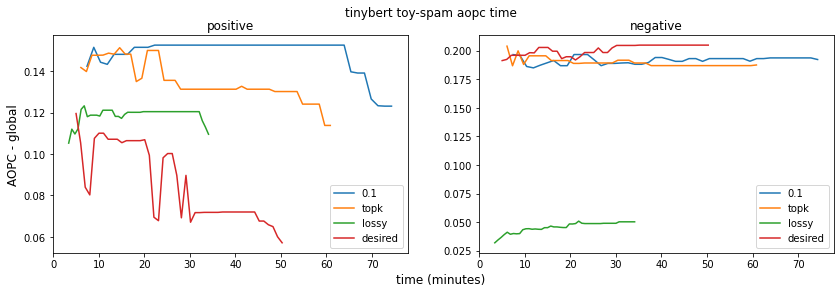

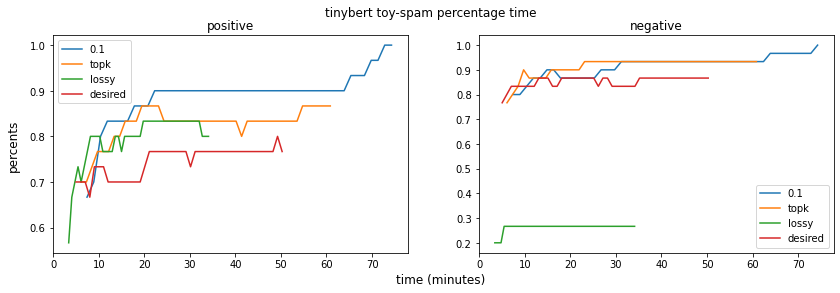

In [18]:
AOPC.time_aopc_monitor(path, title, model, model_type, ds_name, ['0.1', 'topk', 'lossy', 'desired'], tokenizer, anchor_examples, labels, top=30, alpha=0.95)
AOPC.time_percent_monitor(path, model_type, ds_name, ['0.1', 'topk', 'lossy', 'desired'], tokenizer, anchor_examples, labels, top=30, alpha=0.95)

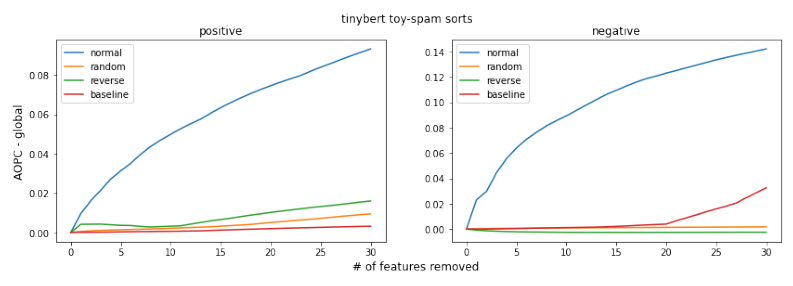

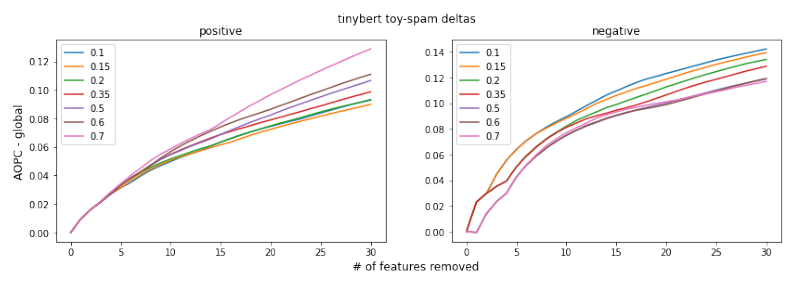

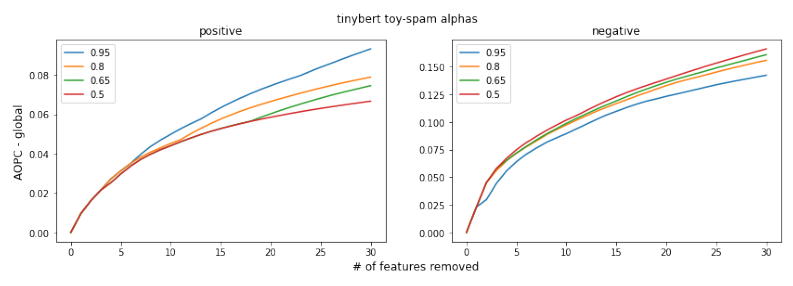

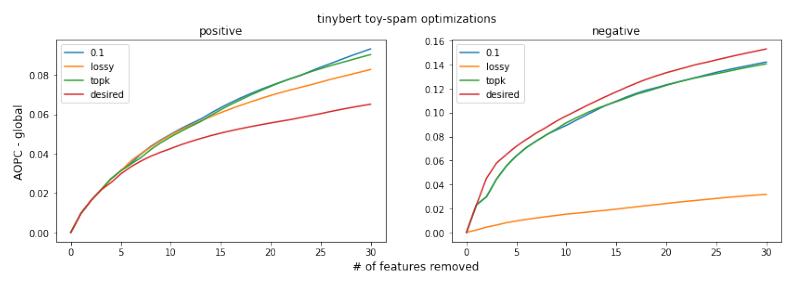

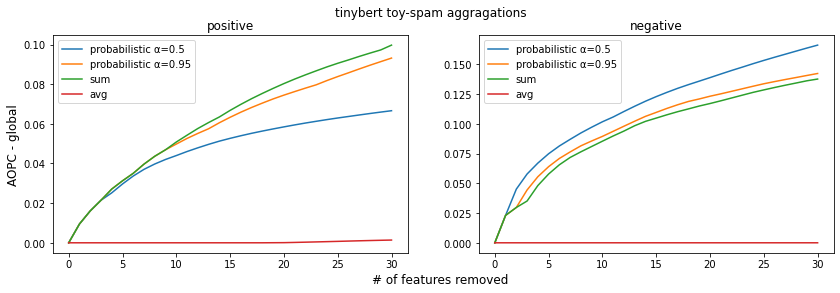

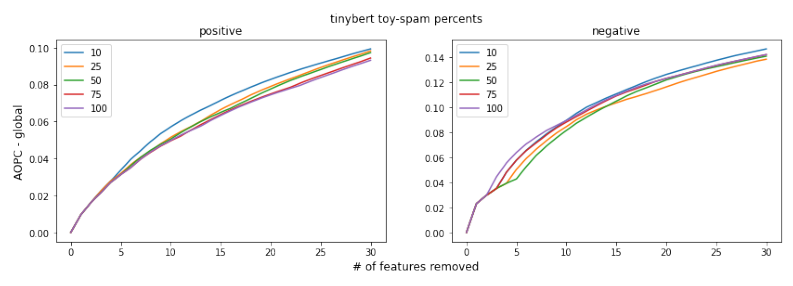

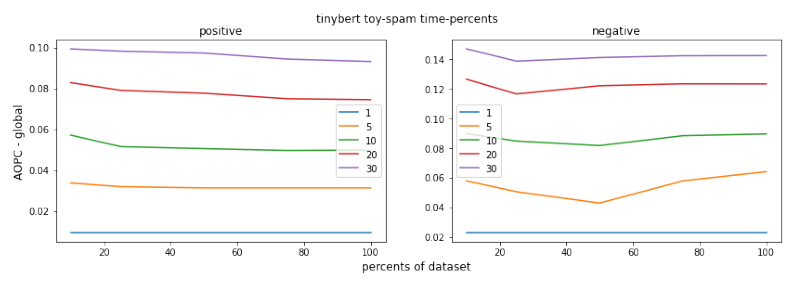

In [6]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

## Sport-Spam

In [4]:
ds_name = 'sport-spam'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

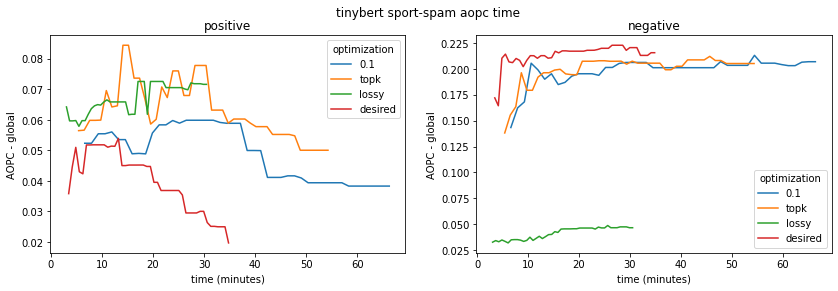

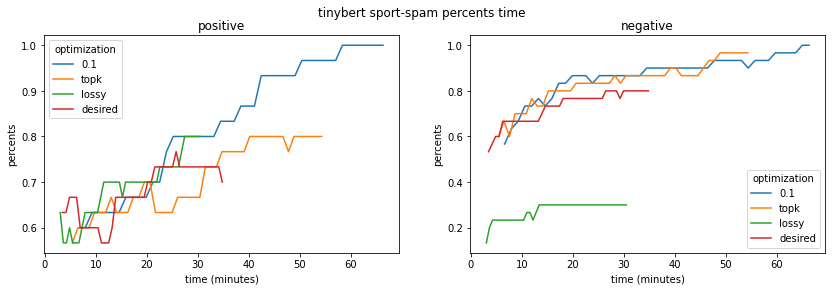

In [20]:
AOPC.time_aopc_monitor(path, title, model, model_type, ds_name, ['0.1', 'topk', 'lossy', 'desired'], tokenizer, anchor_examples, labels, top=30, alpha=0.95)
AOPC.time_percent_monitor(path, model_type, ds_name, ['0.1', 'topk', 'lossy', 'desired'], tokenizer, anchor_examples, labels, top=30, alpha=0.95)

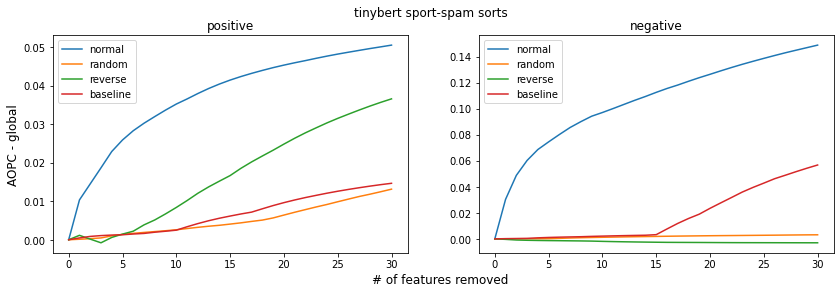

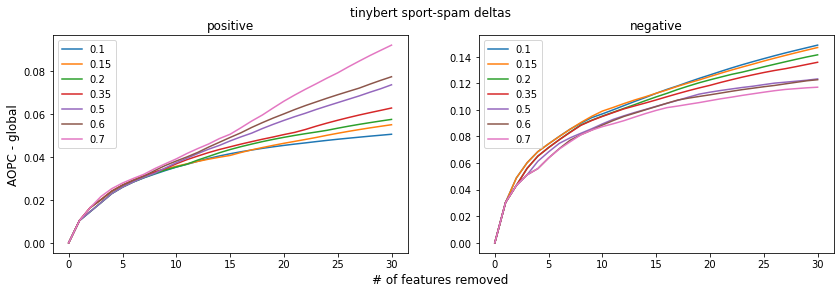

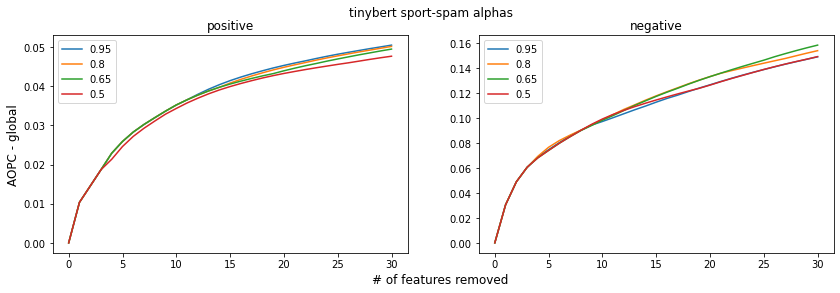

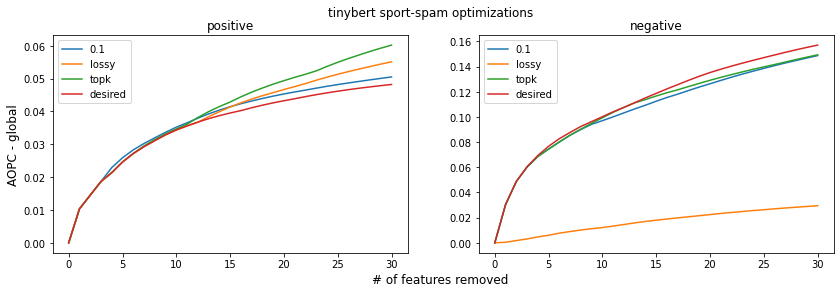

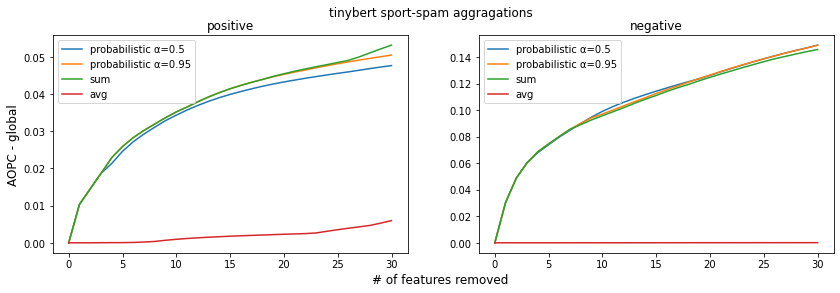

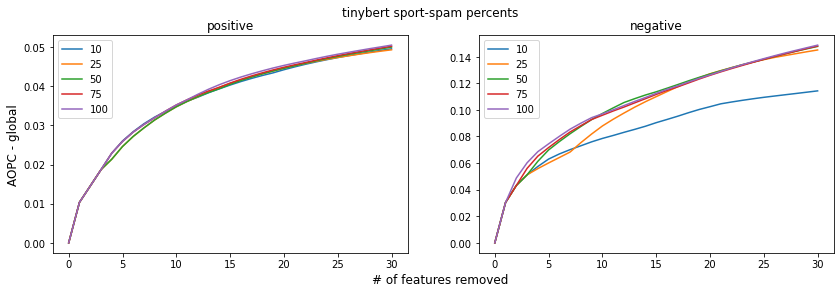

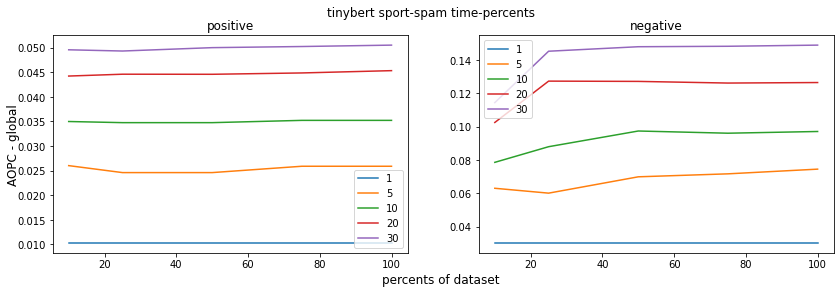

In [9]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

## Home-Spam

In [12]:
ds_name = 'home-spam'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

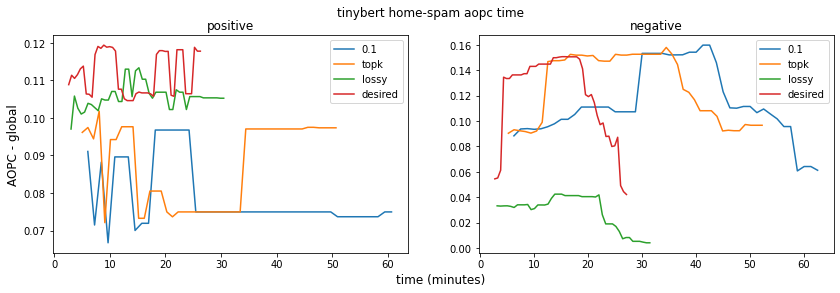

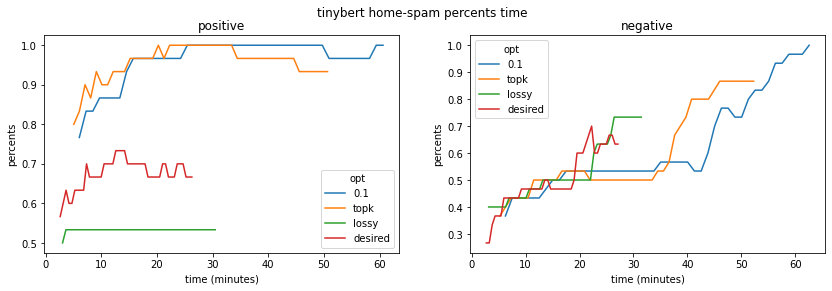

In [14]:
AOPC.time_aopc_monitor(path, title, model, model_type, ds_name, ['0.1', 'topk', 'lossy', 'desired'], tokenizer, anchor_examples, labels, top=30, alpha=0.95)
AOPC.time_percent_monitor(path, model_type, ds_name, ['0.1', 'topk', 'lossy', 'desired'], tokenizer, anchor_examples, labels, top=30, alpha=0.95)

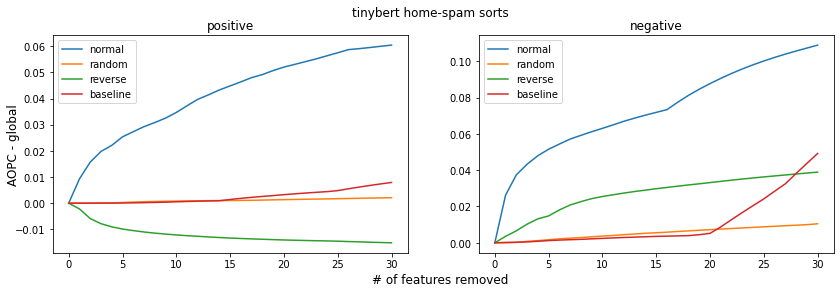

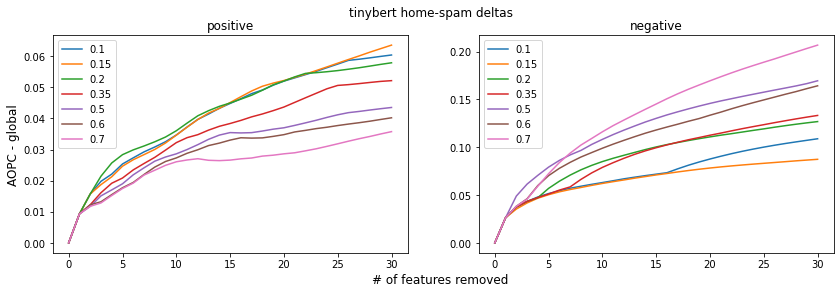

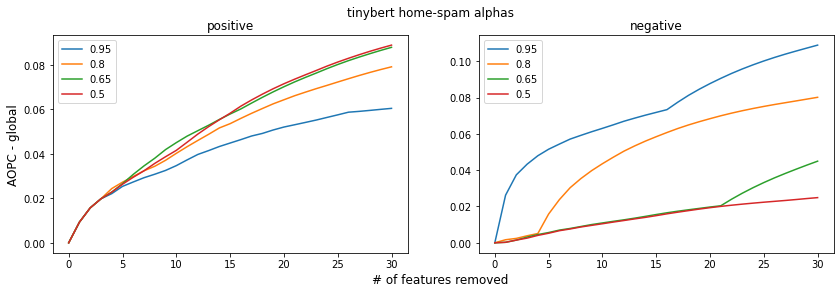

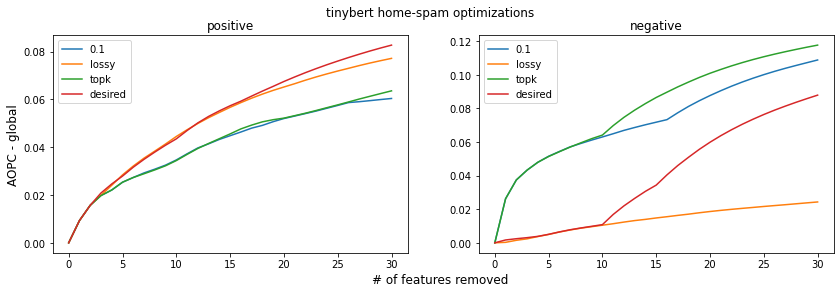

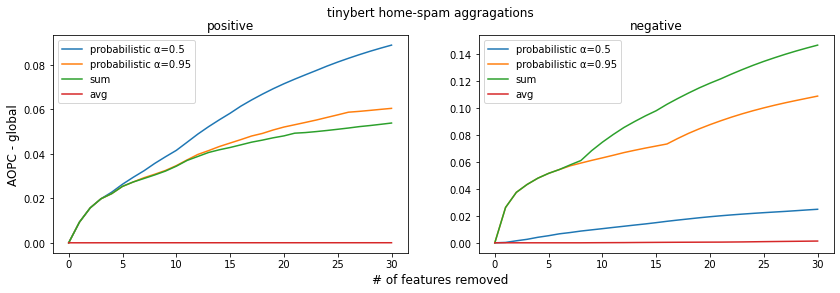

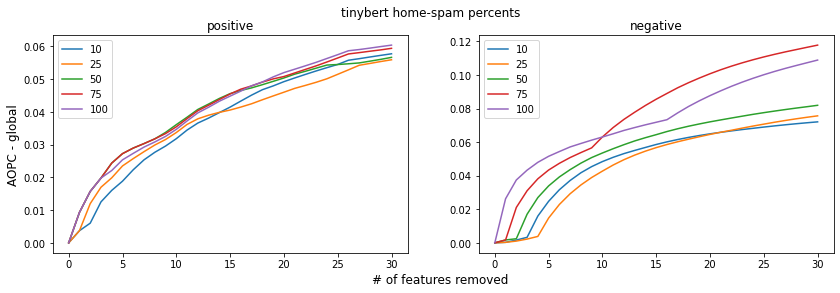

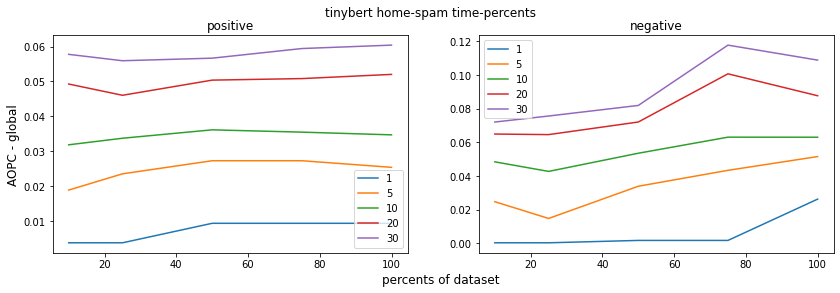

In [15]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

# GRU

## Corona

In [4]:
ds_name = 'corona'
model_type = 'gru'
path = f'results/{model_type}/{ds_name}/{sorting}/'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [5]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

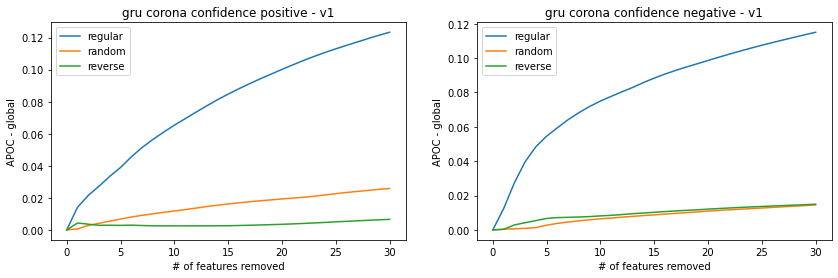

In [6]:
aopc._compare_sorts('remove')

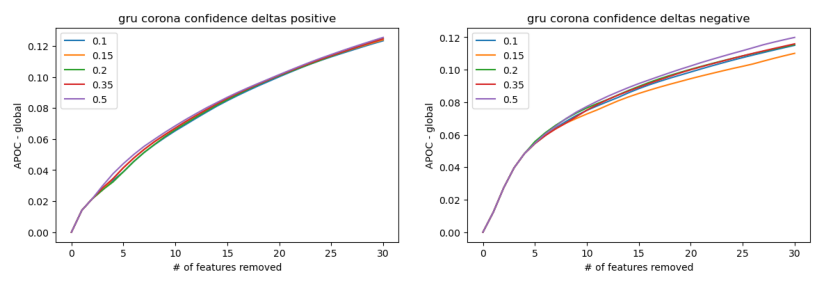

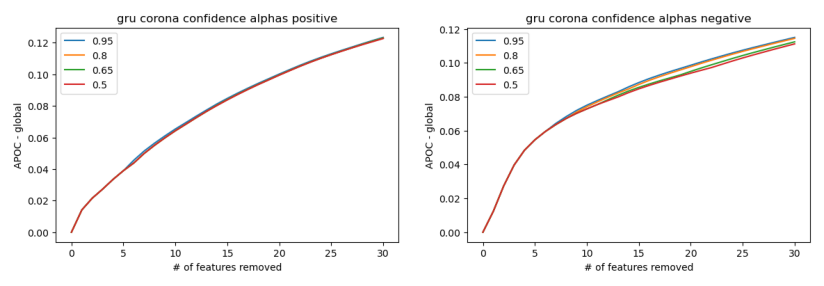

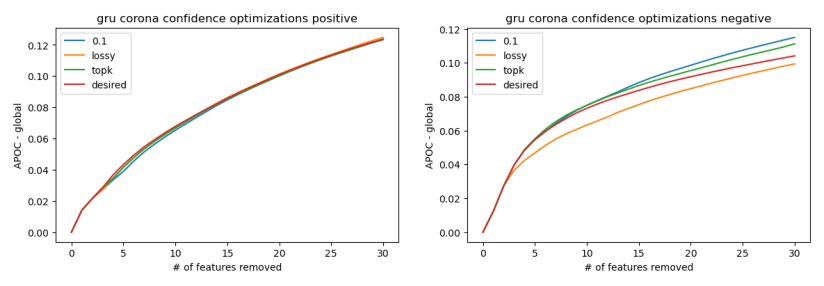

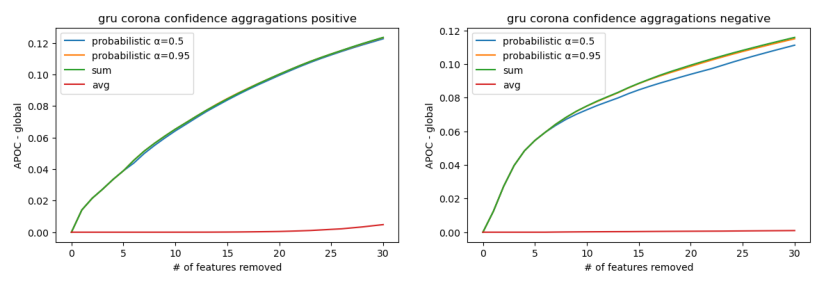

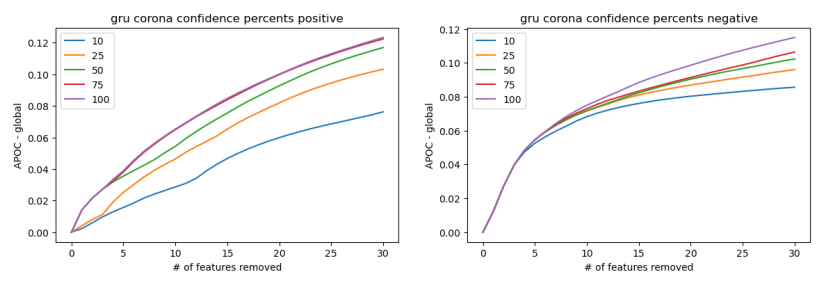

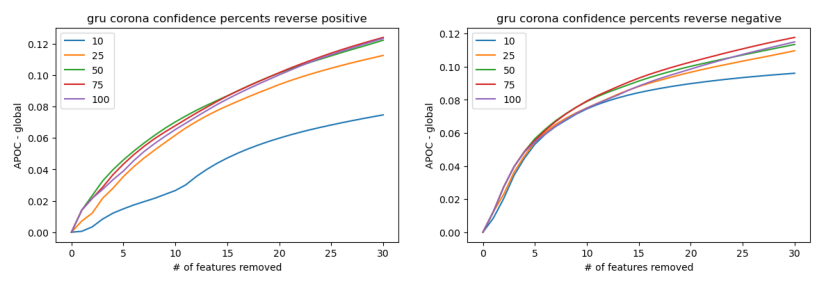

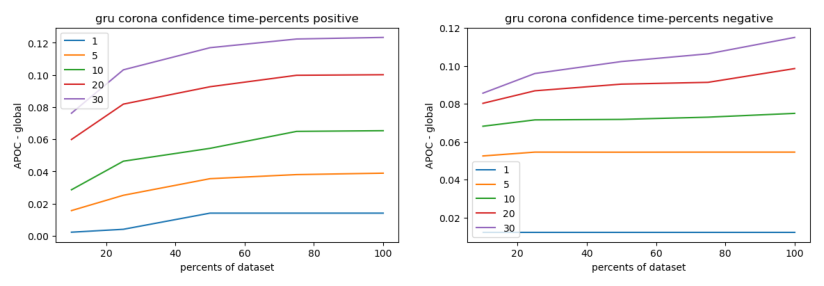

In [7]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

## Sentiment

In [8]:
ds_name = 'sentiment'
model_type = 'gru'
path = f'results/{model_type}/{ds_name}/{sorting}/'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [9]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

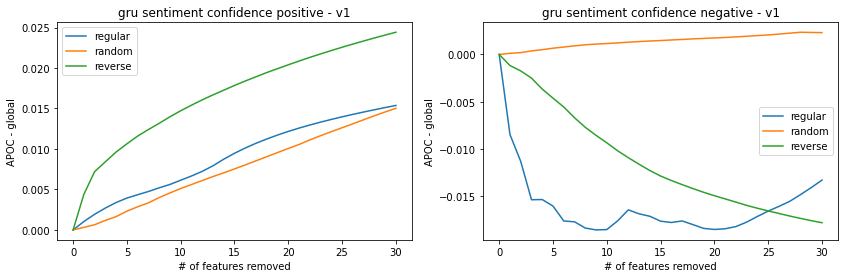

In [10]:
aopc._compare_sorts('remove')

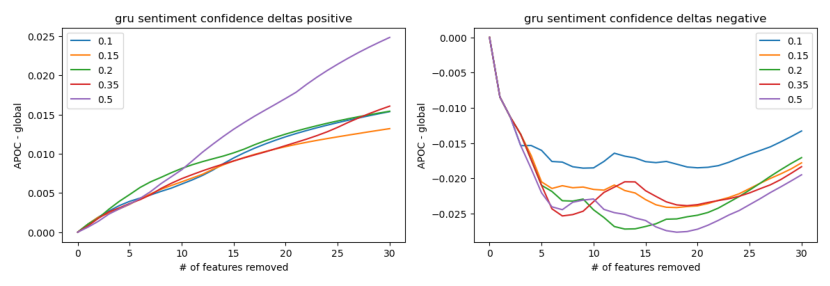

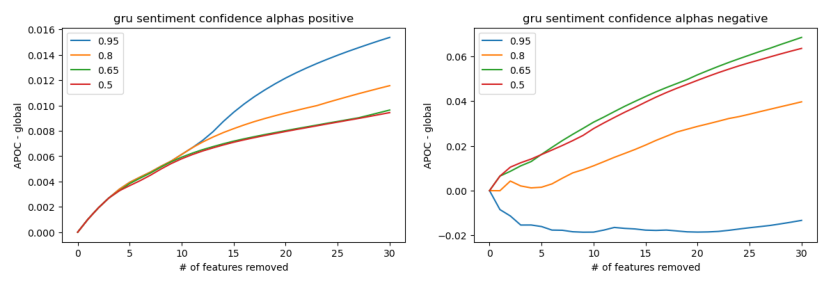

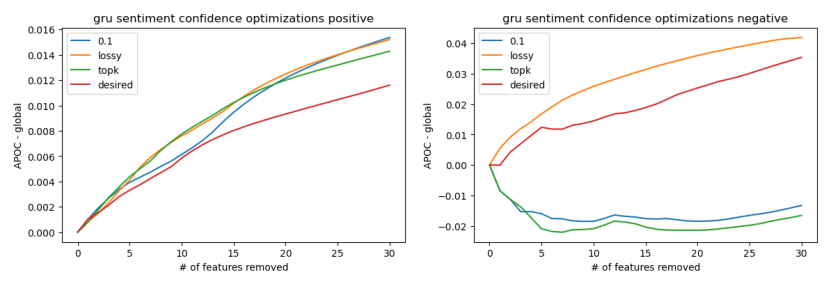

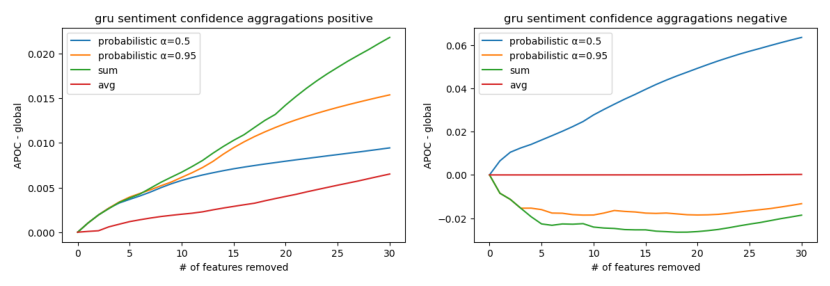

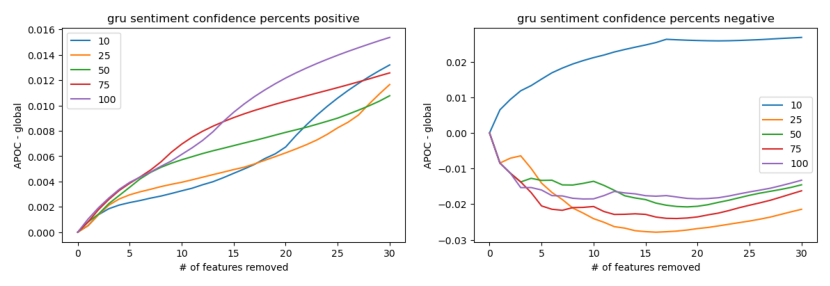

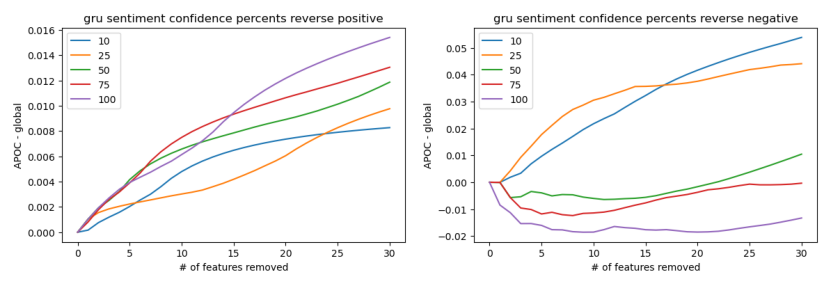

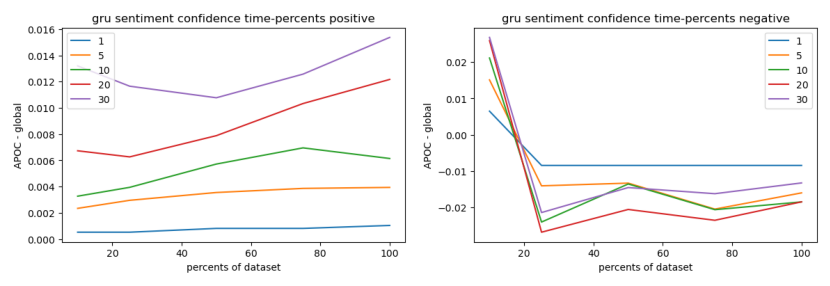

In [11]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

## Dilemma

In [12]:
ds_name = 'dilemma'
model_type = 'gru'
path = f'results/{model_type}/{ds_name}/{sorting}/'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [13]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

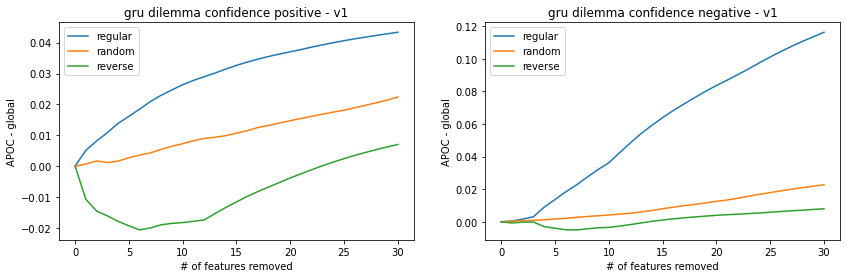

In [14]:
aopc._compare_sorts('remove')

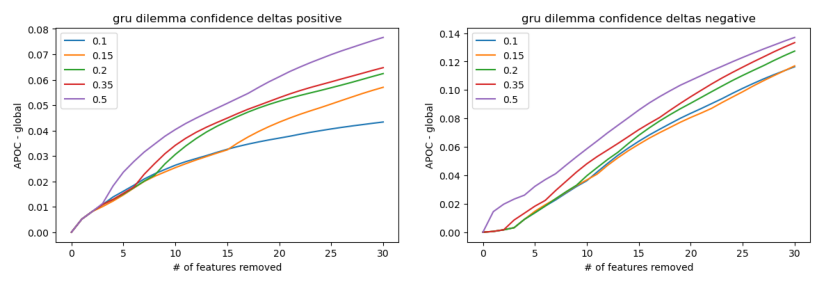

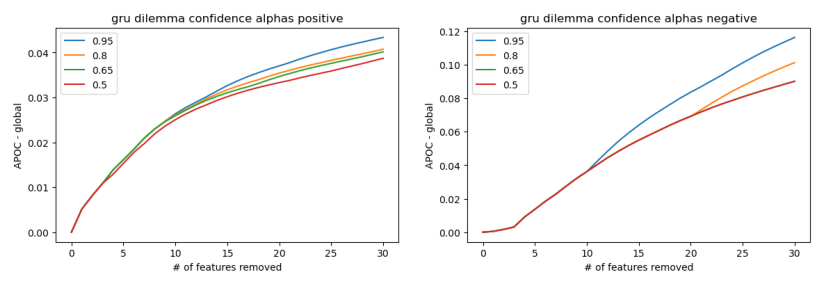

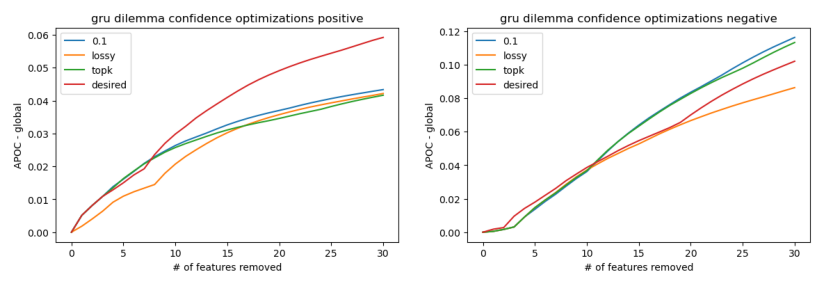

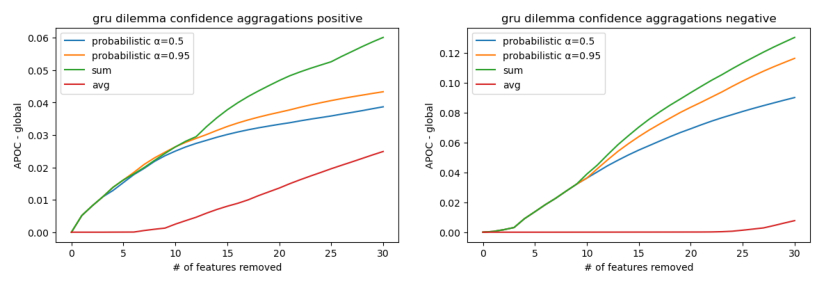

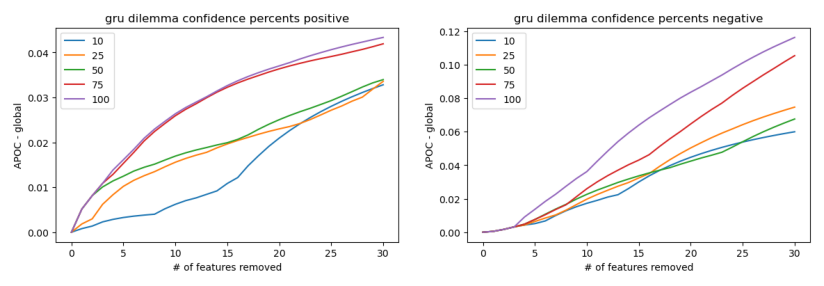

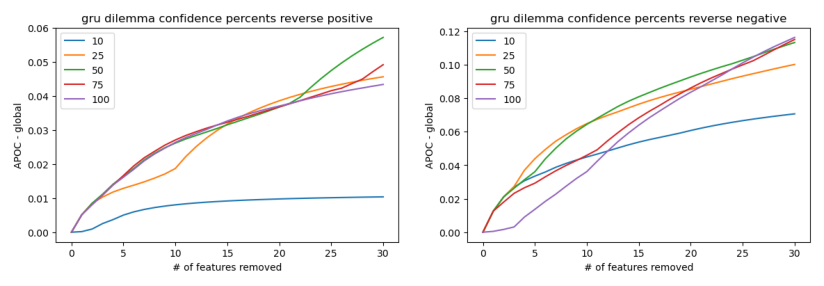

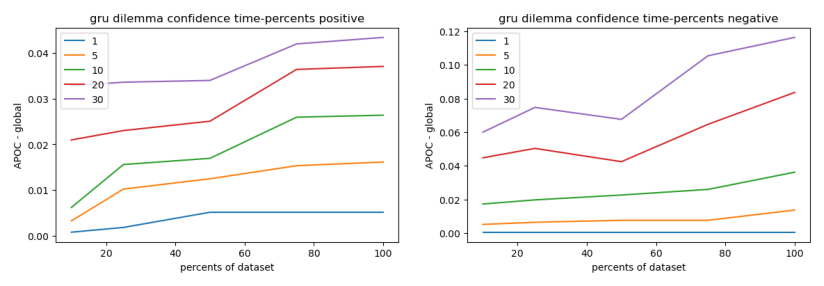

In [15]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

# Logistic

## Corona

In [16]:
ds_name = 'corona'
model_type = 'logistic'
path = f'results/{model_type}/{ds_name}/{sorting}/'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [17]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

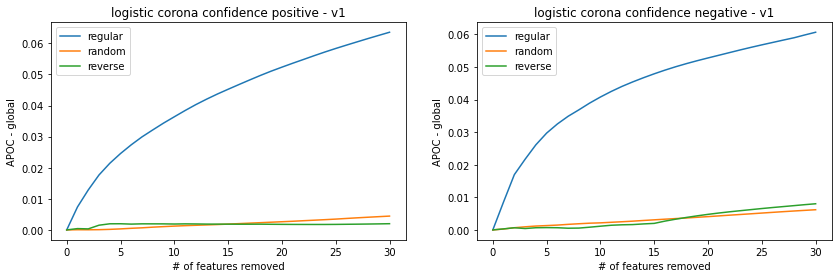

In [18]:
aopc._compare_sorts('remove')

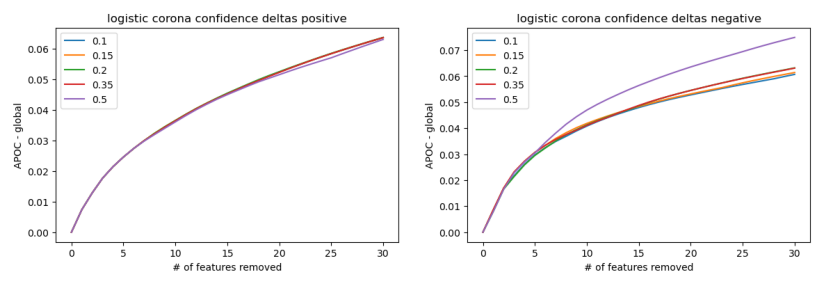

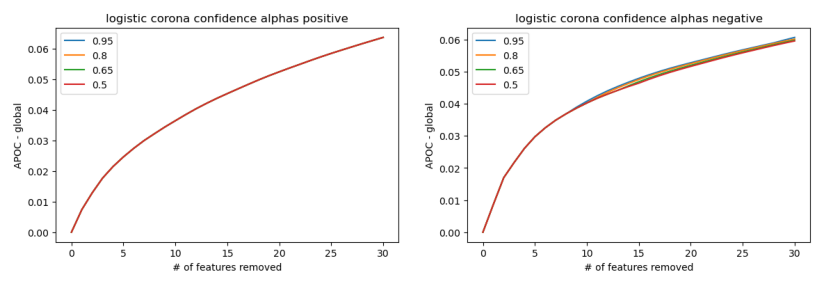

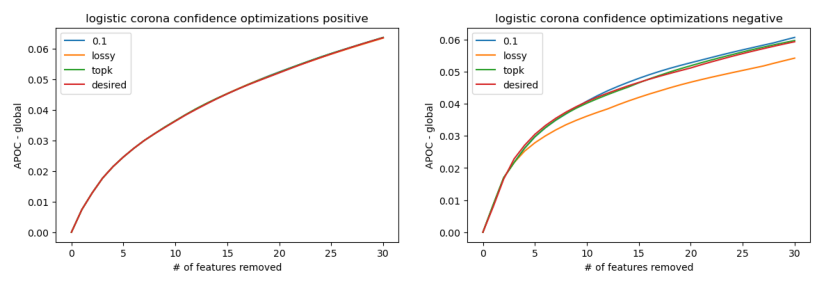

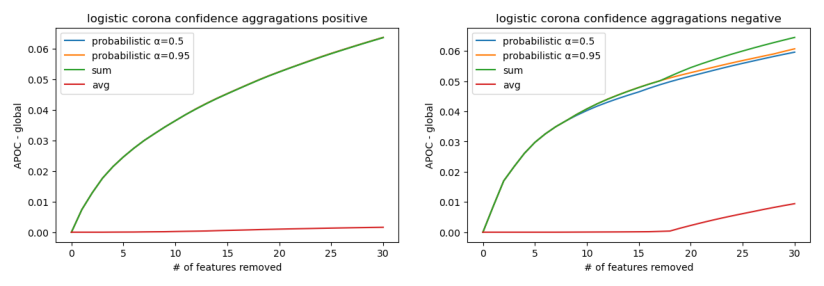

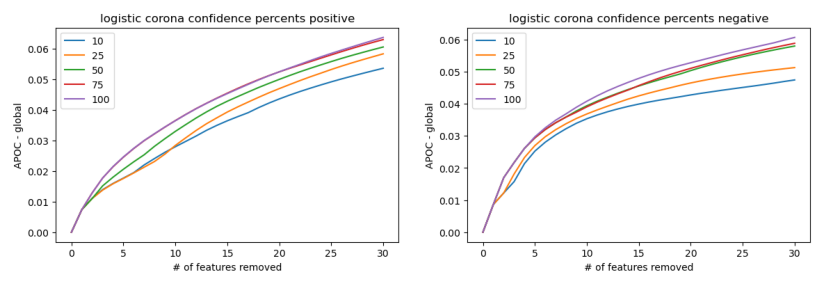

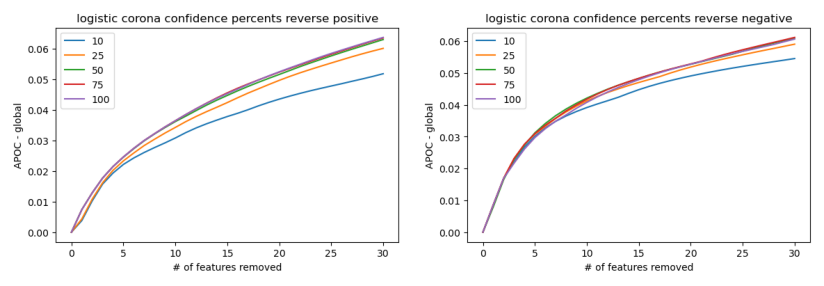

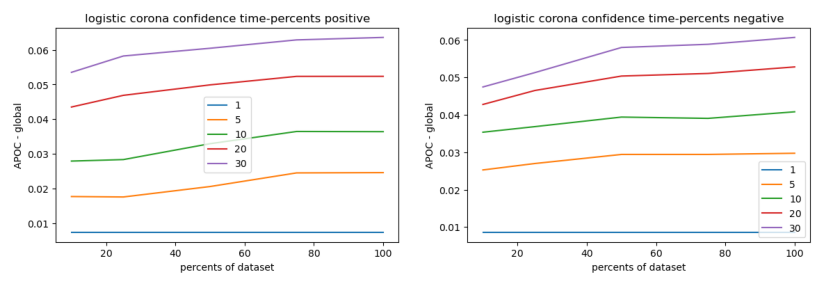

In [19]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(path, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents')

## Sentiment

In [20]:
ds_name = 'sentiment'
model_type = 'logistic'
path = f'results/{model_type}/{ds_name}/{sorting}/'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [21]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

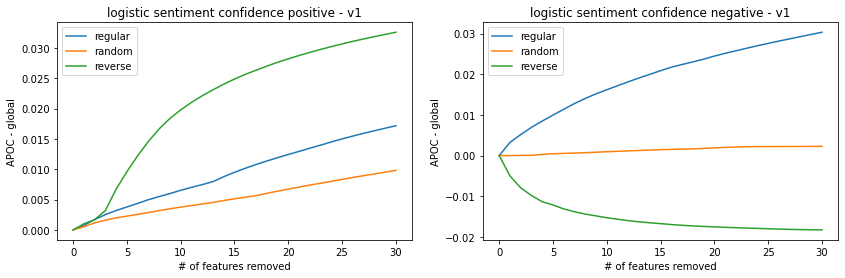

In [22]:
aopc._compare_sorts('remove')

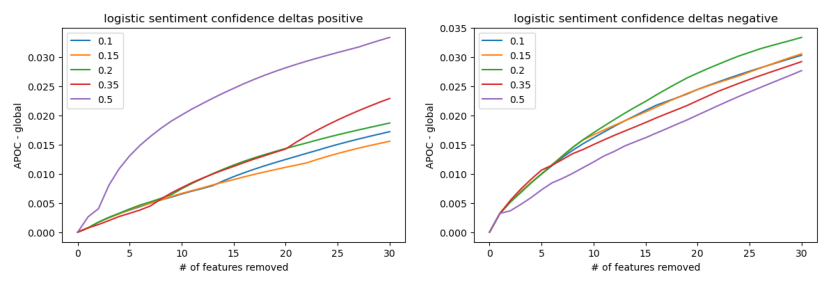

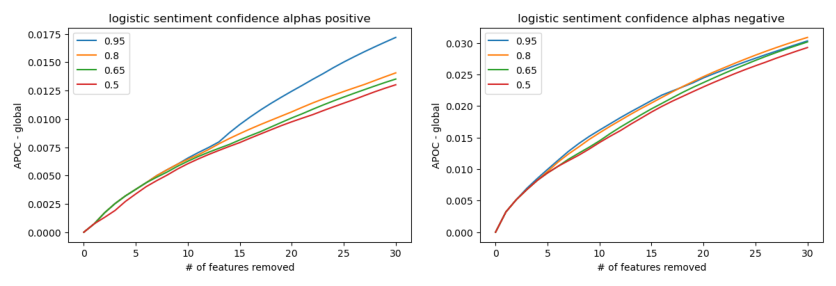

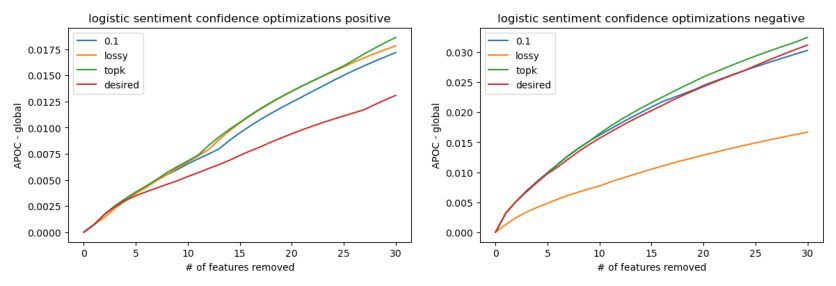

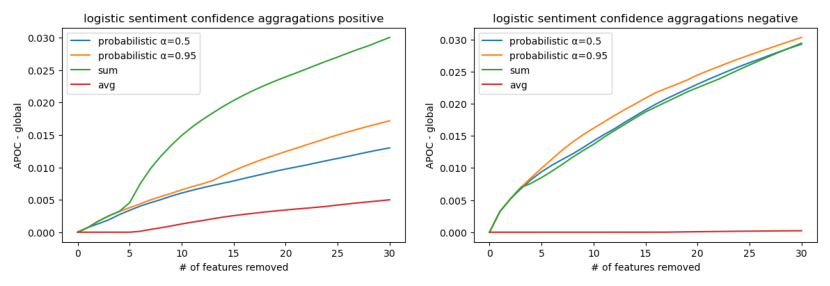

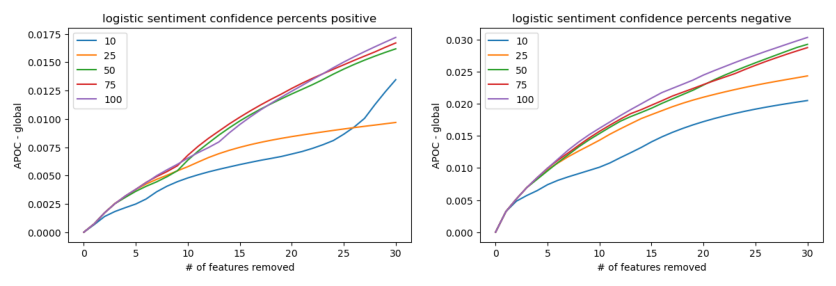

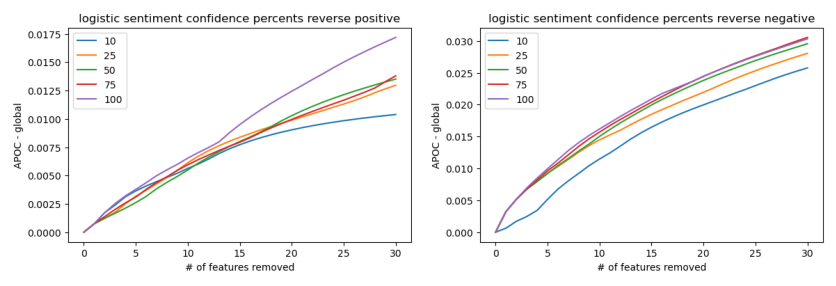

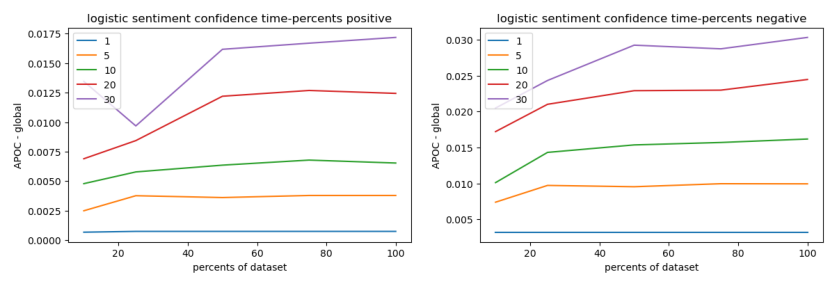

In [23]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(path, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents')

## Dilemma

In [24]:
ds_name = 'dilemma'
model_type = 'logistic'
path = f'results/{model_type}/{ds_name}/{sorting}/'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [25]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

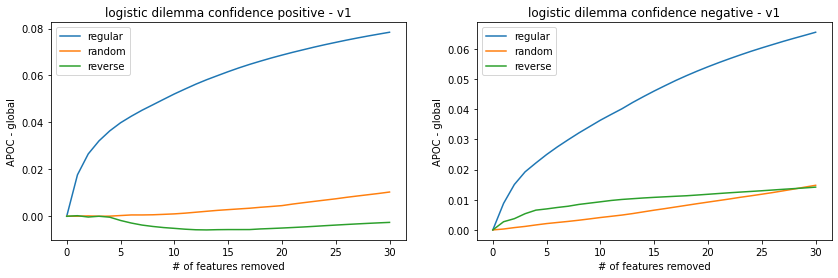

In [26]:
aopc._compare_sorts('remove')

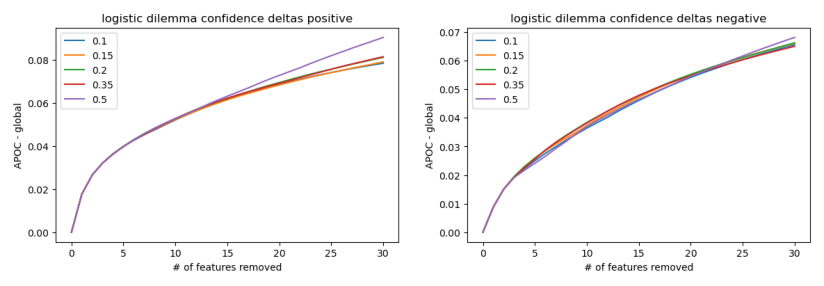

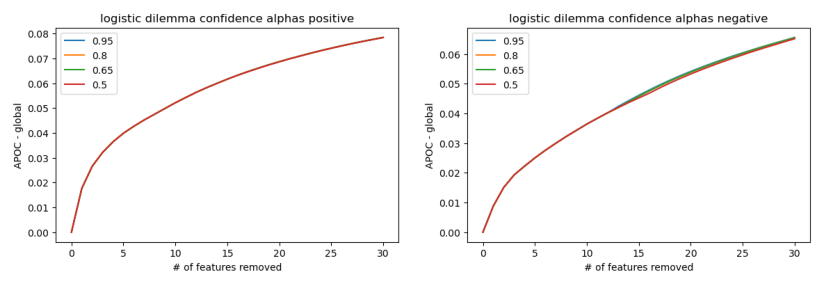

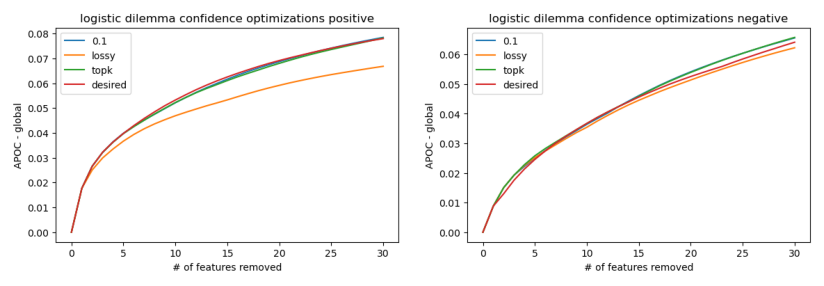

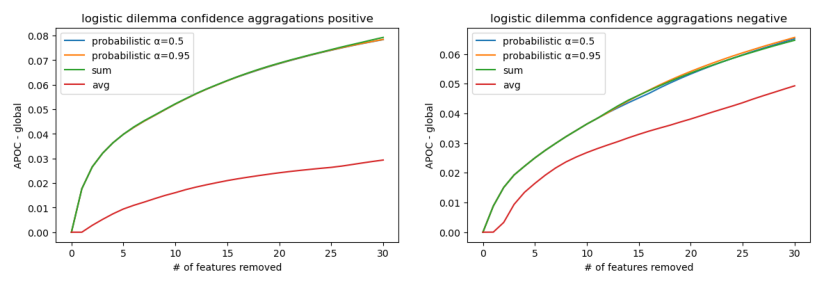

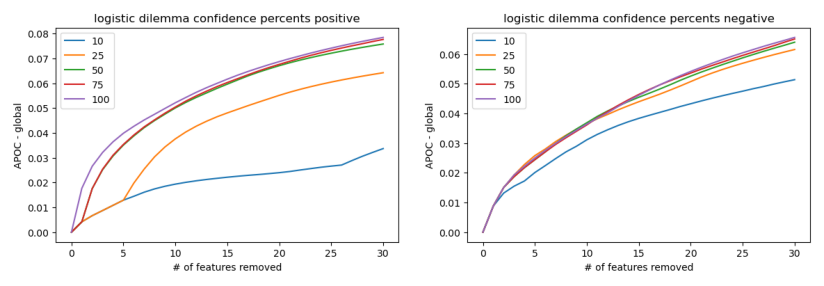

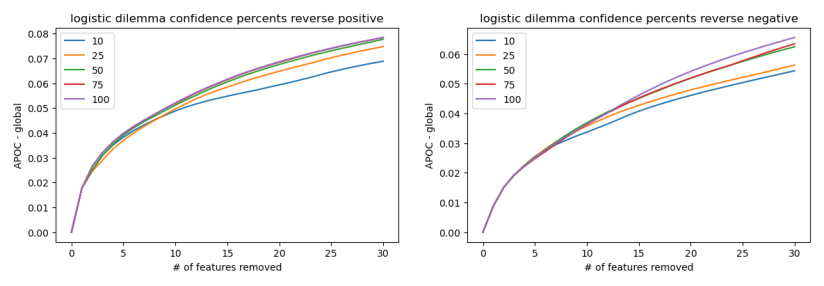

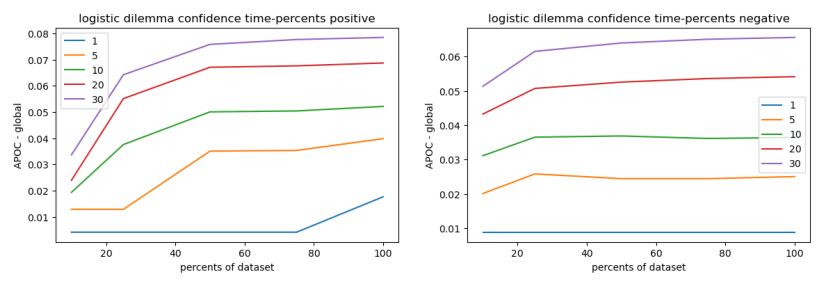

In [27]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(path, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents')

# SVM

## Corona

In [15]:
ds_name = 'corona'
model_type = 'svm'
path = f'results/{model_type}/{ds_name}/{sorting}/'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [16]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

In [ ]:
aopc._compare_sorts('remove')

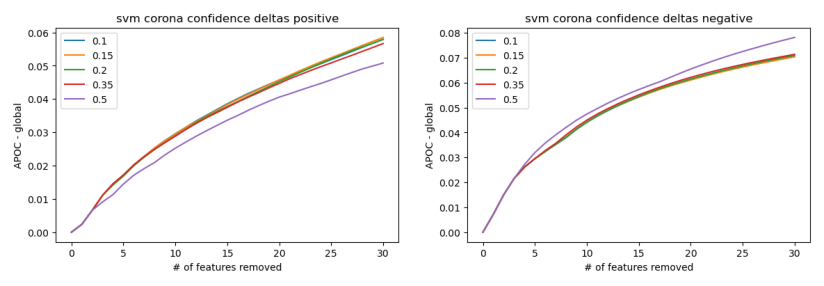

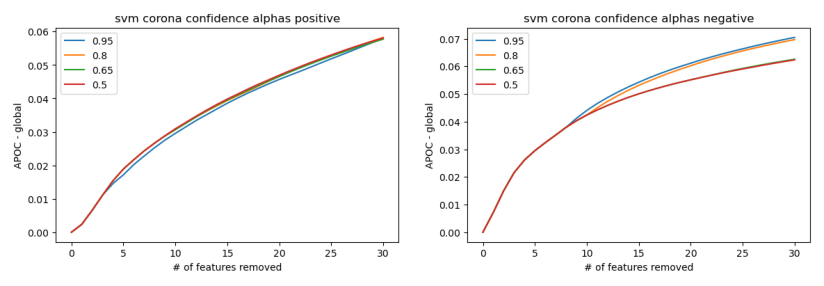

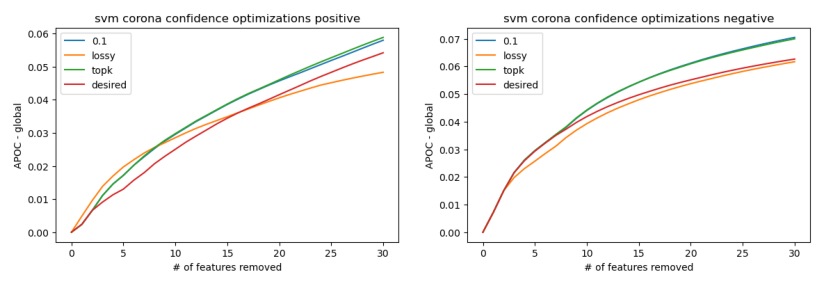

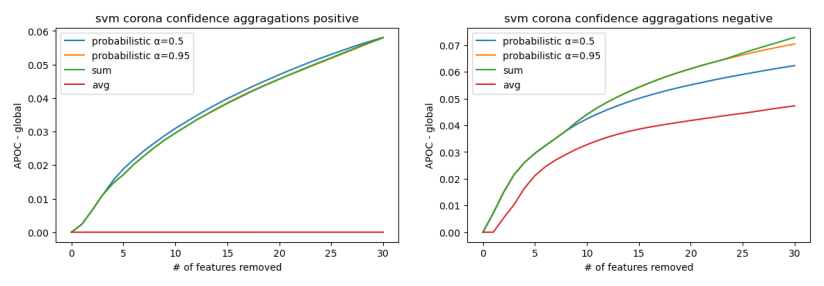

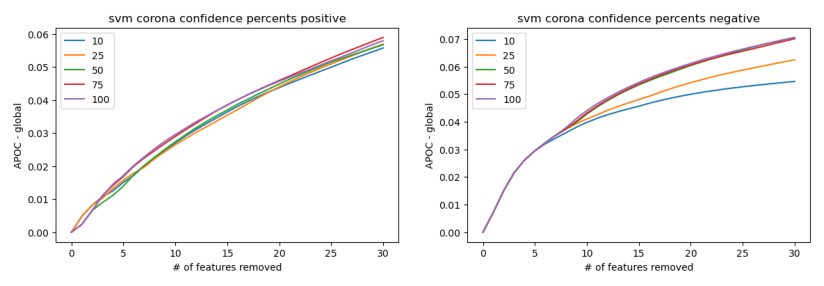

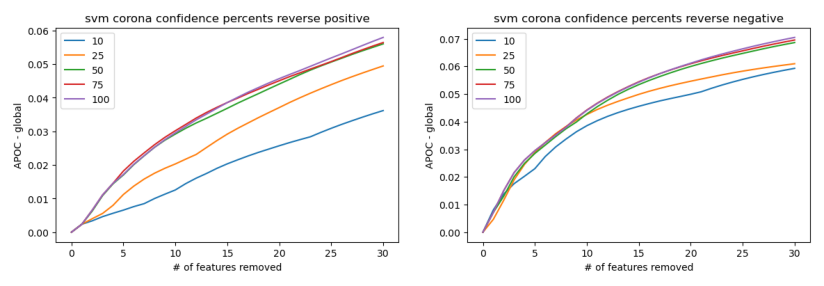

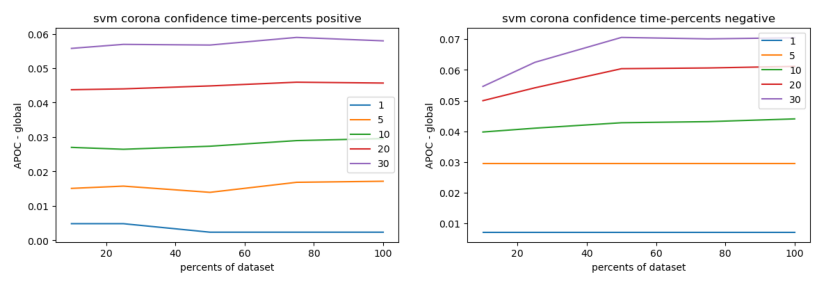

In [10]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(path, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents')

## Sentiment

In [11]:
ds_name = 'sentiment'
model_type = 'svm'
path = f'results/{model_type}/{ds_name}/{sorting}/'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [ ]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

In [ ]:
aopc._compare_sorts('remove')

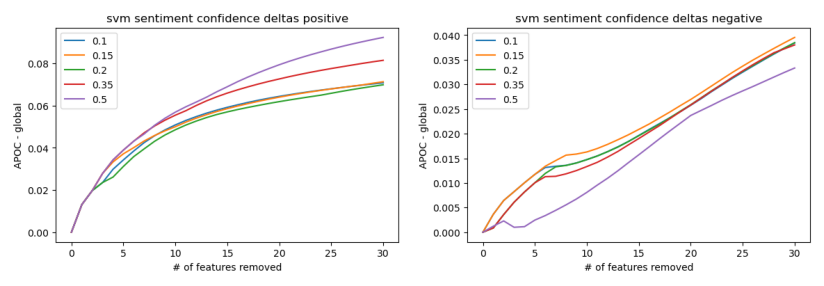

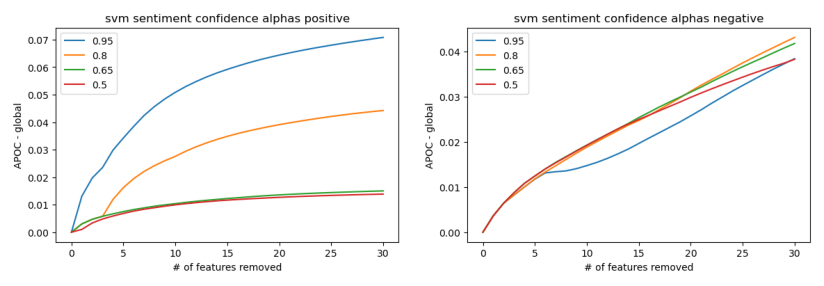

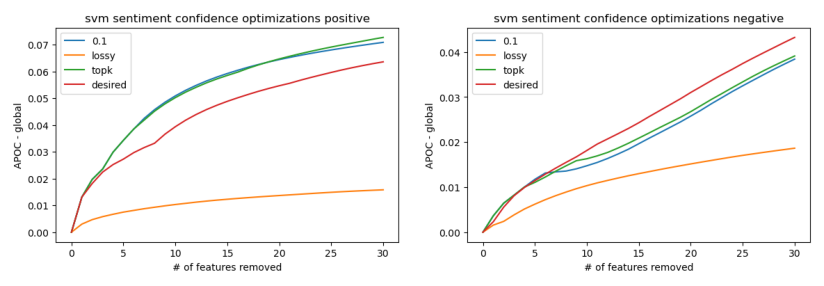

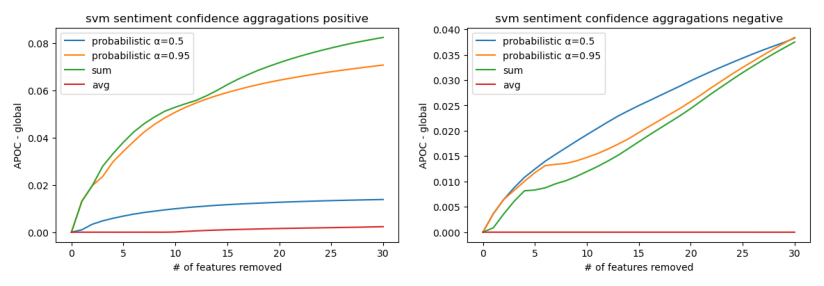

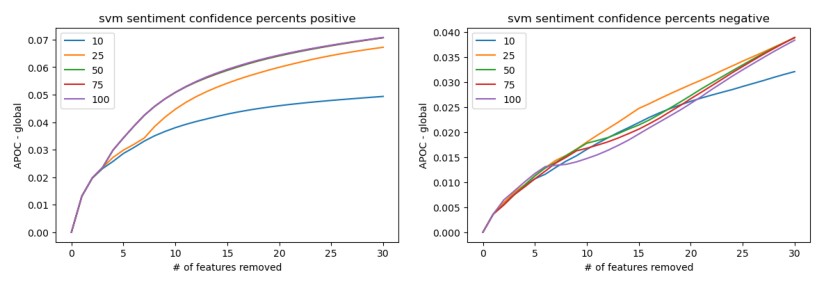

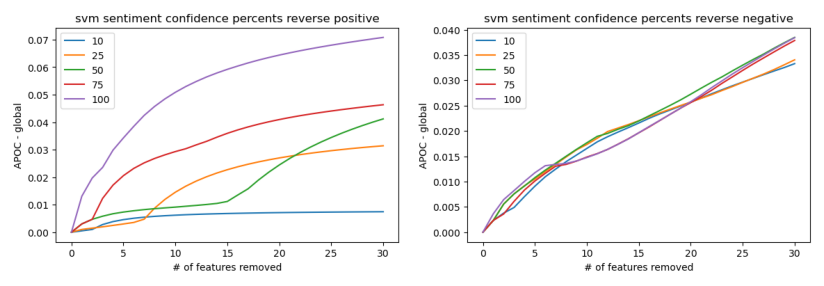

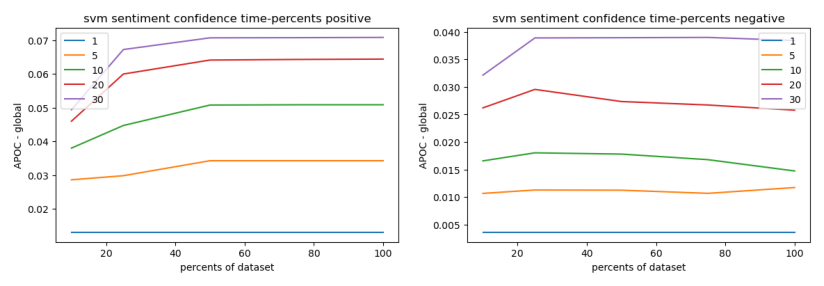

In [12]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(path, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents')

## Dilemma

In [13]:
ds_name = 'dilemma'
model_type = 'svm'
path = f'results/{model_type}/{ds_name}/{sorting}/'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [ ]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

In [ ]:
aopc._compare_sorts('remove')

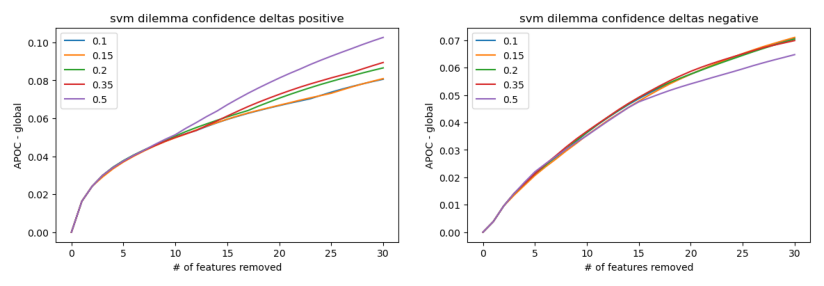

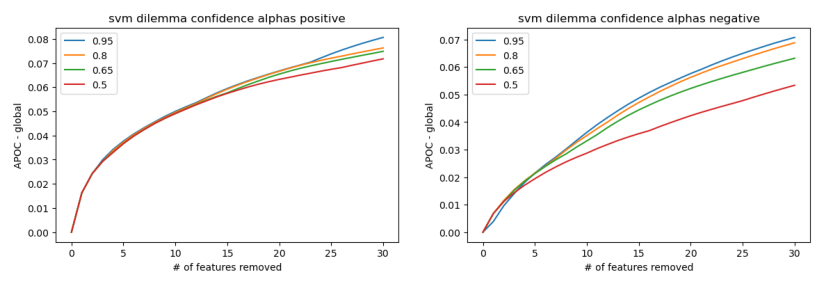

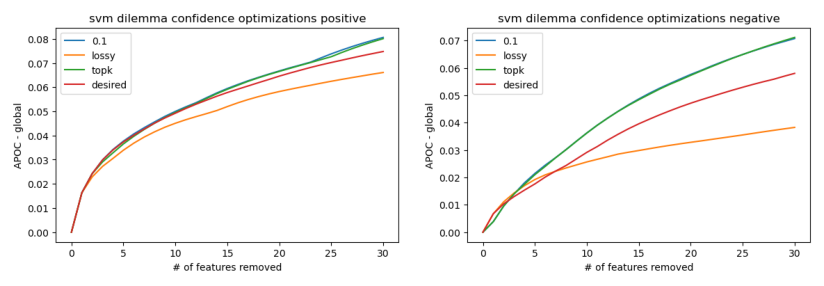

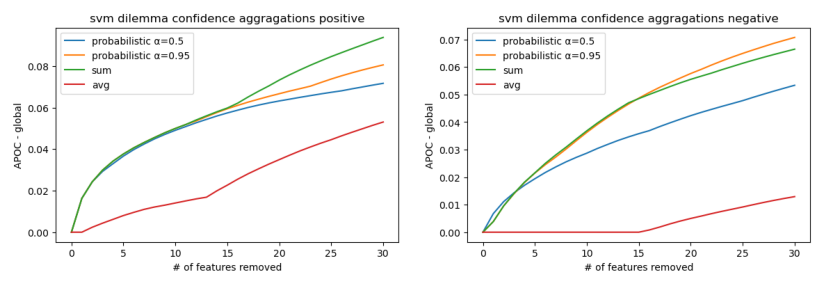

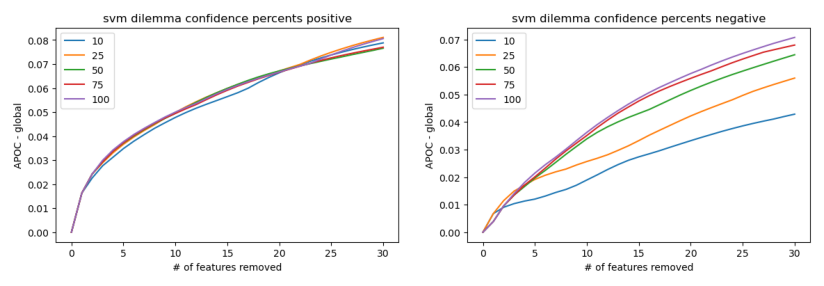

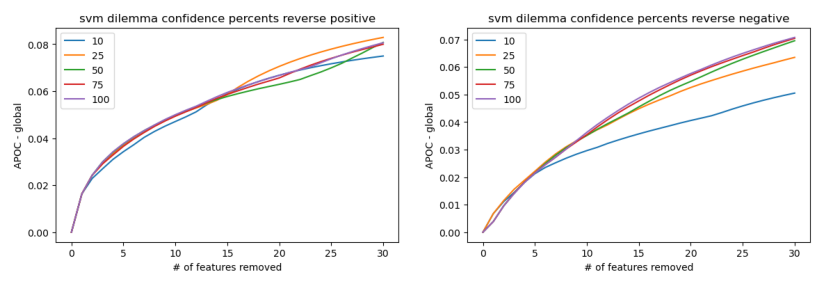

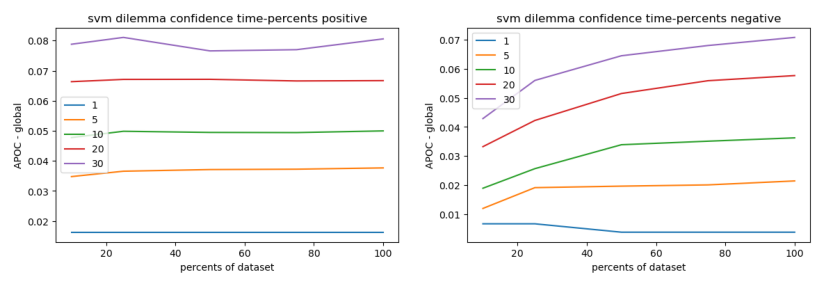

In [14]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(path, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents')